# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import math
pd.set_option('max_columns', None)
pd.set_option('display.min_rows', 15)
pd.set_option('display.max_rows', 50)

pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
print("Vis setup Complete")
print("Setup complete.")

Vis setup Complete
Setup complete.


# 1. Data Exploration

## 1.1 Loading Data and Describe Dataset

In [2]:
#load the data
data_path = r"..\cmp 7023\DiabetesClassificationDataset2022.csv".replace("\\","/")
diabetes_data = pd.read_csv(data_path)
print(diabetes_data.shape)
diabetes_data.head()

(79159, 88)


,encounter_id,hospital_id,gender,ethnicity,age,elective_surgery,height,weight,bmi,readmission_status,icu_type,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_sodium_max,h1_sodium_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,wbc_apache,intubated_apache,d1_heartrate_max,heart_rate_apache,gcs_motor_apache,gcs_eyes_apache,creatinine_apache,bilirubin_apache,h1_spo2_max,paco2_apache,map_apache,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ventilated_apache,diabetes_mellitus
0,214826,118,M,Caucasian,68.0,0,180.3,73.9,22.732803,0,CTICU,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,109.0,19.0,15.0,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.1,0,119.0,118.0,6.0,3.0,2.51,0.4,100.0,NaN,40.0,0,0,0,0,0,0,0,0,1
1,276985,118,F,Caucasian,25.0,0,172.7,95.3,31.952749,0,Med-Surg ICU,36.7,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,96.0,102.0,6.0,3.0,NaN,NaN,98.0,NaN,68.0,0,0,0,0,0,0,0,0,0
2,262220,118,F,Caucasian,81.0,1,165.1,61.7,22.635548,0,CTICU,35.6,34.8,NaN,NaN,NaN,NaN,NaN,NaN,88.0,NaN,NaN,1.6,1.1,NaN,NaN,198.0,43.0,5.0,3.5,NaN,NaN,9.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.0,34.0,1.6,1.1,NaN,NaN,NaN,NaN,337.0,102.0,342.5,236.666667,36.0,33.0,7.37,7.34,337.0,265.0,337.0,337.0,8.0,1,116.0,114.0,6.0,4.0,NaN,NaN,100.0,30.0,60.0,0,0,0,0,0,0,0,1,0
3,201746,33,M,Caucasian,19.0,0,188.0,NaN,NaN,0,Med-Surg ICU,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,89.0,60.0,NaN,NaN,NaN,NaN,100.0,NaN,103.0,0,0,0,0,0,0,0,0,0
4,246060,81,F,Caucasian,77.0,0,160.0,70.2,27.421875,0,Med-Surg ICU,36.3,36.3,1.6,1.6,0.5,0.5,11.0,9.0,128.0,27.0,26.0,1.3,1.3,3.5,3.5,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,NaN,NaN,NaN,NaN,9.0,9.0,8.6,8.6,0.56,0.56,145.0,143.0,27.0,27.0,36.9,36.9,1.3,1.3,3.5,3.5,145.0,145.0,51.0,51.0,54.8,51.000000,37.0,37.0,7.45,7.45,51.0,51.0,51.0,51.0,12.7,0,118.0,120.0,3.0,1.0,0.56,NaN,95.0,37.0,46.0,0,0,0,0,0,0,0,1,1


In [3]:
diabetes_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79159 entries, 0 to 79158
Data columns (total 88 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   encounter_id                 79159 non-null  int64  
 1   hospital_id                  79159 non-null  int64  
 2   gender                       79129 non-null  object 
 3   ethnicity                    78198 non-null  object 
 4   age                          76317 non-null  float64
 5   elective_surgery             79159 non-null  int64  
 6   height                       77978 non-null  float64
 7   weight                       77086 non-null  float64
 8   bmi                          76468 non-null  float64
 9   readmission_status           79159 non-null  int64  
 10  icu_type                     79159 non-null  object 
 11  h1_temp_max                  61223 non-null  float64
 12  h1_temp_min                  61223 non-null  float64
 13  d1_albumin_max  

In [4]:
def count_missing(df):
    """Function to count missing values in a dataframe"""
    total_cells = np.product(df.shape)
    missing_values_count = df.isnull().sum().sum()
    missing_values_percentage = missing_values_count/total_cells*100
    print(f'\nMissing values: {missing_values_count} --- {round(missing_values_percentage,2)}%')
    
count_missing(diabetes_data)


Missing values: 2828626 --- 40.61%


In [5]:
diabetes_data.columns

Index(['encounter_id', 'hospital_id', 'gender', 'ethnicity', 'age',
       'elective_surgery', 'height', 'weight', 'bmi', 'readmission_status',
       'icu_type', 'h1_temp_max', 'h1_temp_min', 'd1_albumin_max',
       'd1_albumin_min', 'd1_bilirubin_max', 'd1_bilirubin_min', 'd1_bun_max',
       'd1_bun_min', 'd1_glucose_min', 'd1_hco3_max', 'd1_hco3_min',
       'd1_inr_max', 'd1_inr_min', 'd1_lactate_max', 'd1_lactate_min',
       'd1_platelets_max', 'd1_platelets_min', 'd1_potassium_max',
       'd1_potassium_min', 'd1_sodium_max', 'd1_sodium_min', 'd1_wbc_max',
       'd1_wbc_min', 'h1_albumin_max', 'h1_albumin_min', 'h1_bilirubin_max',
       'h1_bilirubin_min', 'h1_bun_max', 'h1_bun_min', 'h1_calcium_max',
       'h1_calcium_min', 'h1_creatinine_max', 'h1_creatinine_min',
       'h1_glucose_max', 'h1_glucose_min', 'h1_hco3_max', 'h1_hco3_min',
       'h1_hematocrit_max', 'h1_hematocrit_min', 'h1_inr_max', 'h1_inr_min',
       'h1_lactate_max', 'h1_lactate_min', 'h1_sodium_max', '

In [6]:
#Calculation of total cells in the dataframe
total_cells = np.product(diabetes_data.shape)
total_missing = diabetes_data.isnull().sum().sum()
print(f'Total Cells: {total_cells}')
# percent of data that is missing
percent_missing = (total_missing/total_cells) * 100
print(f'Total Missing: {total_missing}')
print(f'Percent Missing: {round(percent_missing,2)}%')

Total Cells: 6965992
Total Missing: 2828626
Percent Missing: 40.61%


In [7]:
diabetes_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
encounter_id,79159.0,212863.726740,38113.816591,147001.000000,179772.000000,212864.000000,245812.000000,278997.00000
hospital_id,79159.0,106.188620,63.776527,1.000000,49.000000,112.000000,165.000000,204.00000
age,76317.0,62.452389,16.446715,0.000000,53.000000,65.000000,75.000000,89.00000
elective_surgery,79159.0,0.189404,0.391831,0.000000,0.000000,0.000000,0.000000,1.00000
height,77978.0,169.565316,10.835017,137.200000,162.500000,170.000000,177.800000,195.59000
weight,77086.0,85.114552,25.465505,38.600000,67.700000,81.600000,98.400000,186.00000
bmi,76468.0,29.600786,8.487987,14.844926,23.875433,28.029903,33.420162,67.81499
...,...,...,...,...,...,...,...,...
hepatic_failure,79159.0,0.013744,0.116429,0.000000,0.000000,0.000000,0.000000,1.00000
immunosuppression,79159.0,0.025379,0.157275,0.000000,0.000000,0.000000,0.000000,1.00000


### - Drop all the columns with more than 60% missing of Data

In [8]:
missing_values_count = pd.DataFrame(diabetes_data.isna().sum())
missing_values_count.shape

(88, 1)

In [9]:
drop_list=[]
for i in range(missing_values_count.shape[0]):
    percent=missing_values_count.iloc[i,0]/diabetes_data.shape[0]
    if percent>0.6:
        drop_list.append(missing_values_count.index[i])
    elif percent>0:
        print(f"{missing_values_count.index[i].ljust(25)}---- {(percent*100).round(2)} %")
len(drop_list)

gender                   ---- 0.04 %
ethnicity                ---- 1.21 %
age                      ---- 3.59 %
height                   ---- 1.49 %
weight                   ---- 2.62 %
bmi                      ---- 3.4 %
h1_temp_max              ---- 22.66 %
h1_temp_min              ---- 22.66 %
d1_albumin_max           ---- 54.44 %
d1_albumin_min           ---- 54.44 %
d1_bilirubin_max         ---- 58.71 %
d1_bilirubin_min         ---- 58.71 %
d1_bun_max               ---- 9.99 %
d1_bun_min               ---- 9.99 %
d1_glucose_min           ---- 5.51 %
d1_hco3_max              ---- 15.03 %
d1_hco3_min              ---- 15.03 %
d1_platelets_max         ---- 14.11 %
d1_platelets_min         ---- 14.11 %
d1_potassium_max         ---- 9.08 %
d1_potassium_min         ---- 9.08 %
d1_sodium_max            ---- 9.62 %
d1_sodium_min            ---- 9.62 %
d1_wbc_max               ---- 13.24 %
d1_wbc_min               ---- 13.24 %
h1_glucose_max           ---- 55.3 %
h1_glucose_min           --

38

In [10]:
diabetes_data[drop_list].head(10)

,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_hco3_max,h1_hco3_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_sodium_max,h1_sodium_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,bilirubin_apache,paco2_apache
0,NaN,NaN,1.3,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.6,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.0,34.0,1.6,1.1,NaN,NaN,NaN,NaN,337.0,102.0,342.5,236.666667,36.0,33.0,7.37,7.34,337.0,265.0,337.0,337.0,NaN,30.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.3,1.3,3.5,3.5,NaN,NaN,NaN,NaN,9.0,9.0,8.6,8.6,0.56,0.56,27.0,27.0,36.9,36.9,1.3,1.3,3.5,3.5,145.0,145.0,51.0,51.0,54.8,51.000000,37.0,37.0,7.45,7.45,51.0,51.0,51.0,51.0,NaN,37.0
5,1.1,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,18.0,8.7,8.7,0.78,0.78,30.0,30.0,33.5,33.5,NaN,NaN,NaN,NaN,135.0,135.0,370.0,370.0,370.0,370.000000,43.0,43.0,7.42,7.42,370.0,370.0,370.0,370.0,NaN,43.0
7,2.7,2.7,0.7,0.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.7,2.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1.2,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.2,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,104.0,104.0,260.0,260.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,40.0


In [11]:
#drop more than 60%
df=diabetes_data.drop(columns=drop_list)
df
count_missing(df)


Missing values: 468325 --- 11.83%


In [12]:
# check unique values
for column in df.keys():
    print(f'{column} unique values: {df[column].nunique()}')

encounter_id unique values: 79156
hospital_id unique values: 203
gender unique values: 2
ethnicity unique values: 6
age unique values: 75
elective_surgery unique values: 2
height unique values: 394
weight unique values: 3070
bmi unique values: 31616
readmission_status unique values: 1
icu_type unique values: 8
h1_temp_max unique values: 324
h1_temp_min unique values: 336
d1_albumin_max unique values: 39
d1_albumin_min unique values: 38
d1_bilirubin_max unique values: 491
d1_bilirubin_min unique values: 466
d1_bun_max unique values: 424
d1_bun_min unique values: 402
d1_glucose_min unique values: 256
d1_hco3_max unique values: 222
d1_hco3_min unique values: 253
d1_platelets_max unique values: 558
d1_platelets_min unique values: 539
d1_potassium_max unique values: 82
d1_potassium_min unique values: 87
d1_sodium_max unique values: 63
d1_sodium_min unique values: 110
d1_wbc_max unique values: 2790
d1_wbc_min unique values: 2538
h1_glucose_max unique values: 604
h1_glucose_min unique values:

In [13]:
# Drop readmission_status because only 1 unique value: 0
print(df['readmission_status'].value_counts())
df.drop('readmission_status',axis= 1, inplace=True)
count_missing(df)

0    79159
Name: readmission_status, dtype: int64

Missing values: 468325 --- 12.07%


<AxesSubplot:>

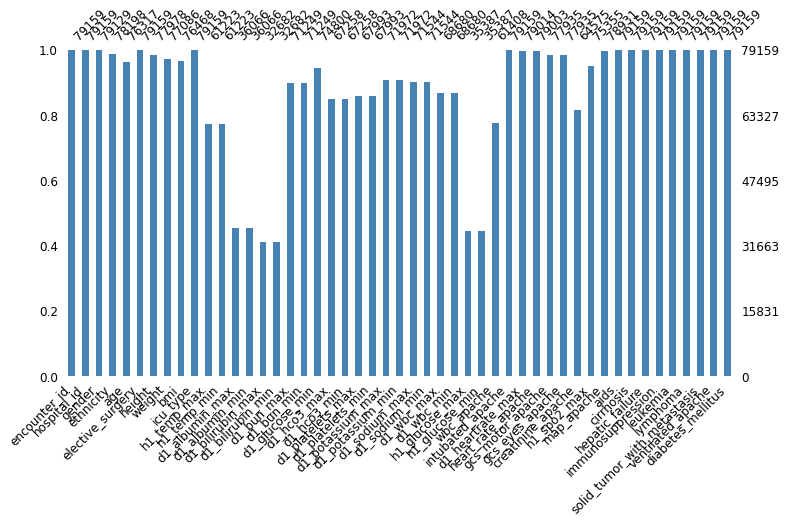

In [14]:
#Visual the missing Data
import missingno as msno
msno.bar(df, figsize=(12, 6), fontsize=12, color='steelblue')

In [15]:
#check on unique value of Age 
np.sort(df.age.unique())
#drop all the 0 value of Age
df=df[df.age!=0]

In [16]:
def DistPlot(df,hue,column):
    """ Make distribution plots of df for a defined column using hue"""
    plt.figure(figsize=(10,4))
    plt.xticks(rotation=30) 
    # produce a plot f
    sns.countplot(x=column, hue=hue,palette="coolwarm", data=df)
    #include a dynamic title
    plt.title("Distribution of " +column)
     #include a legend
    plt.legend()
    return

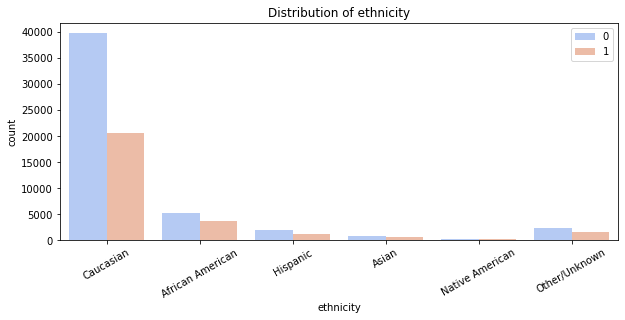

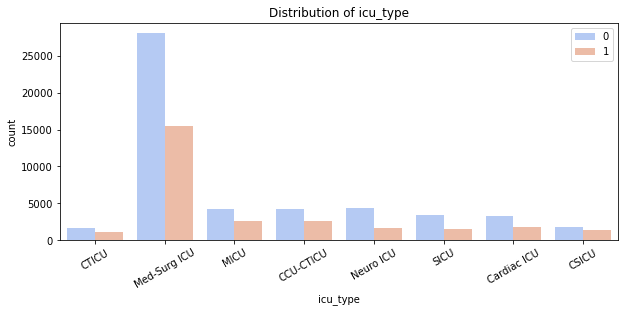

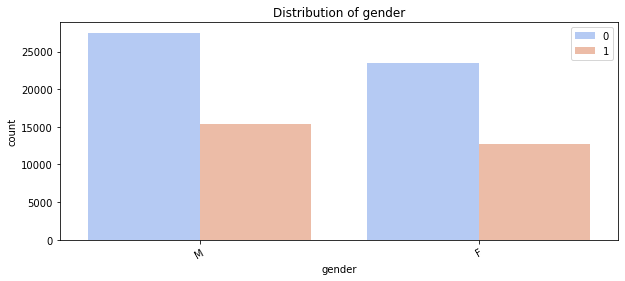

In [17]:
DistPlot(df,'diabetes_mellitus','ethnicity')
DistPlot(df,'diabetes_mellitus','icu_type')
DistPlot(df,'diabetes_mellitus','gender')

In [18]:
for column in ['gender','ethnicity','height','weight','bmi']:
    filter = df[f'{column}'].isna()
    missing_obs = len(df[filter])
    print(f'Found {missing_obs} NaN in {column}')

Found 18 NaN in gender
Found 948 NaN in ethnicity
Found 1173 NaN in height
Found 2067 NaN in weight
Found 2683 NaN in bmi


In [19]:
len(df[(df.height.isna()==True)|(df.weight.isna()==True)])

2683

In [20]:
len(df[(df.height.isna()==True)&(df.bmi.isna()==True)])

1173

In [21]:
len(df[(df.weight.isna()==True)&(df.bmi.isna()==True)])

2067

In [22]:
len(df[(df.bmi.isna()==True)&(df.weight.isna()==True)&(df.height.isna()==False)])

1510

In [23]:
len(df[(df.bmi.isna()==True)&(df.weight.isna()==False)&(df.height.isna()==True)])

616

In [24]:
len(df[((df.weight.isna()==False)&(df.height.isna()==False))&(df.bmi.isna()==True)])

0

#### We can see that BMI are computed from Height and Weight, and they BMI missing only due to Height, Weight or both of them missing. Therefore, we only drop the case of both Height and Weight are missing together. For the other cases, we can impute later

In [25]:
df.shape

(79144, 49)

In [26]:
df=df[~((df.height.isna()==True)&(df.weight.isna()==True))]
df.shape

(78587, 49)

In [27]:
#drop Na in Gender
df.dropna(subset=['gender'],inplace=True)

In [28]:
df['ethnicity'].value_counts()

Caucasian           60019
African American     8726
Other/Unknown        3871
Hispanic             3127
Asian                1346
Native American       611
Name: ethnicity, dtype: int64

In [29]:
df['ethnicity'].fillna(value='Other/Unknown',inplace=True)

In [30]:
df.bmi.isnull().sum()

2123

In [31]:
for column in ['gender','ethnicity','height','weight','bmi']:
    filter = df[f'{column}'].isna()
    missing_obs = len(df[filter])
    print(f'Found {missing_obs} NaN in {column}')

Found 0 NaN in gender
Found 0 NaN in ethnicity
Found 613 NaN in height
Found 1510 NaN in weight
Found 2123 NaN in bmi


In [32]:
#incorrect computed BMI index
df.loc[(round(df.weight/(df.height/100)**2,6)!=round(df.bmi,6))&df.bmi.notna(),'bmi']=round(df.weight/(df.height/100)**2,6)


In [33]:
df.loc[df.height.isna()&df.bmi.notna(),['bmi','weight','height']]

,bmi,weight,height


### Duplicate Columns Finding

### - Checkpoint Saved

In [34]:
df.to_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"),index=False)


In [35]:
def getDuplicateColumns(df):
    '''
    Get a list of duplicate columns.
    It will iterate over all the columns in dataframe and find the columns whose contents are duplicate.
    :param df: Dataframe object
    :return: List of columns whose contents are duplicates.
    '''
    duplicateColumnNames = set()
    # Iterate over all the columns in dataframe
    for x in range(df.shape[1]):
        # Select column at xth index.
        col = df.iloc[:, x]
        # Iterate over all the columns in DataFrame from (x+1)th index till end
        for y in range(x + 1, df.shape[1]):
            # Select column at yth index.
            otherCol = df.iloc[:, y]
            # Check if two columns at x 7 y index are equal
            if col.equals(otherCol):
                duplicateColumnNames.add(df.columns.values[y])
    return list(duplicateColumnNames)

In [36]:
# Get list of duplicate columns
duplicateColumnNames = getDuplicateColumns(df)
print('Duplicate Columns are as follows')
for col in duplicateColumnNames:
    print('Column name : ', col)

Duplicate Columns are as follows


There are no Duplicate columns

### - Checkpoint Saved

In [37]:
df.to_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"),index=False)


In [38]:
df=pd.read_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"))


### Correlate Variables

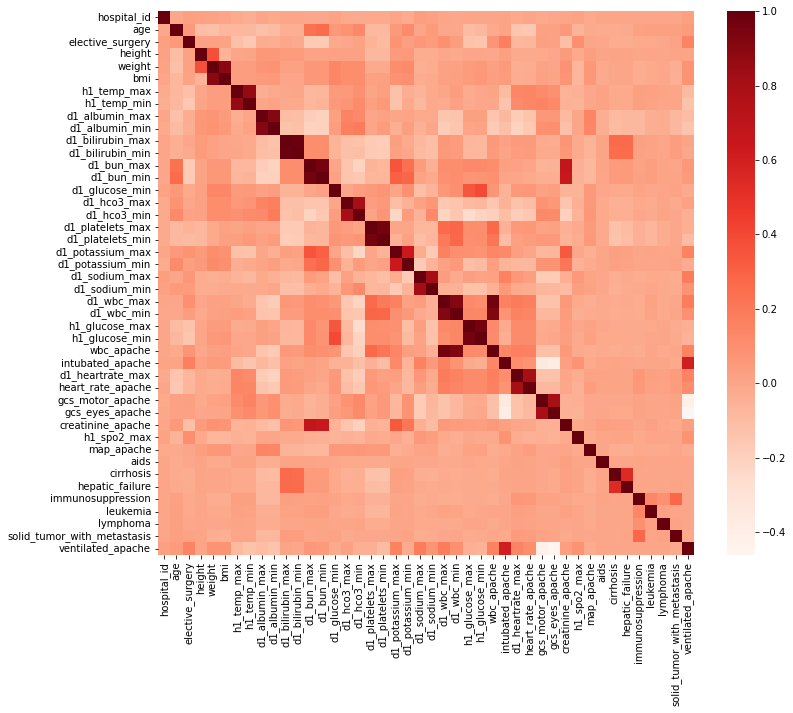

In [39]:
corr=df.loc[:,~df.columns.isin(['diabetes_mellitus','encounter_id'])].corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=False, cmap=plt.cm.Reds)
plt.show()

### GCS Score: https://en.wikipedia.org/wiki/Glasgow_Coma_Scale

In [40]:
# GCS Score is the sum of score of each test (E for Eye, V for Verbal, and M for Motor)
gcs_columns = ['gcs_eyes_apache', 'gcs_motor_apache']

df['gcs_score'] = df[gcs_columns].sum(axis=1)

# numerical_columns.append('gcs_score')
df.drop(gcs_columns, axis=1, inplace=True)

In [41]:
# Specify min max columns => only keep the mean
min_max_columns = [
    'h1_temp_max', 
    'h1_temp_min', 
    'd1_albumin_max', 
    'd1_albumin_min',
    'd1_bilirubin_max', 
    'd1_bilirubin_min',
    'd1_bun_max', 
    'd1_bun_min', 
    'd1_hco3_max', 
    'd1_hco3_min', 
    'd1_platelets_max', 
    'd1_platelets_min', 
    'd1_potassium_max', 
    'd1_potassium_min', 
    'd1_sodium_max', 
    'd1_sodium_min', 
    'd1_wbc_max', 
    'd1_wbc_min', 
    'h1_glucose_max', 
    'h1_glucose_min',
]

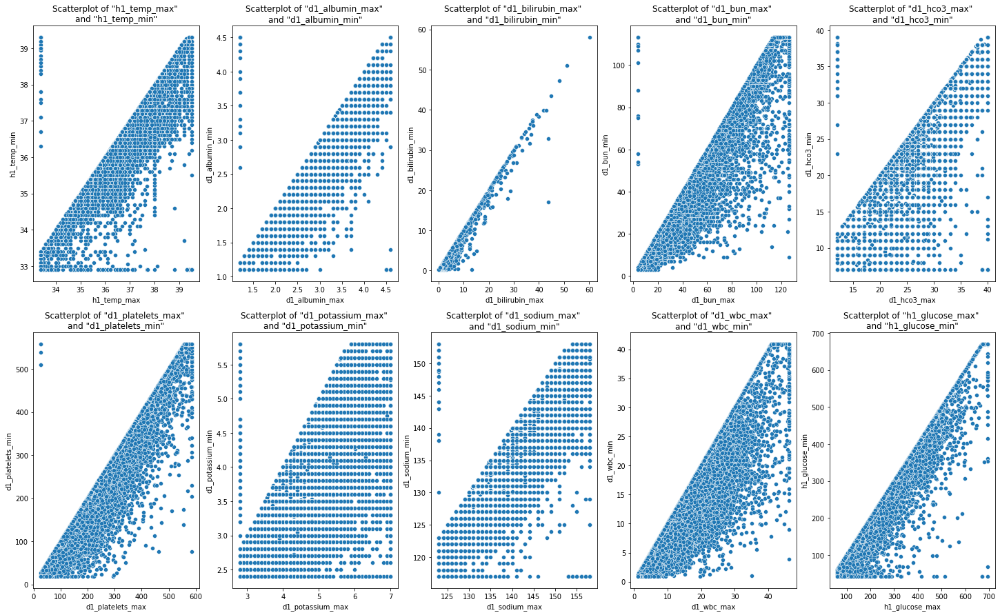

In [42]:
def SCATPlots_min_max(df, rows, cols):
    """ Make scatterplots for min and max"""
     # Add figure box
    plt.figure(figsize=(25,15))
    i=0
    u=1
    for column in min_max_columns:
        while i<20:        
            plt.subplot(rows,cols,u)
            max_column = min_max_columns[i]
            min_column = min_max_columns[i+1]
            sns.scatterplot(x = df[max_column], y=df[min_column])
            plt.title(f'Scatterplot of "{max_column}" \nand "{min_column}"')
            i+=2
            u+=1
            
SCATPlots_min_max(df,2,5)

In [45]:
#Calculate Average Columns
for i in range(len(min_max_columns)):
    if i%2==0:
        df[f"{min_max_columns[i].strip('_max')}_avg"] = df[[min_max_columns[i], min_max_columns[i+1]]].mean(axis=1)
        df.drop(columns=[min_max_columns[i],min_max_columns[i+1]],inplace=True)
    

In [46]:
df.columns

Index(['encounter_id', 'hospital_id', 'gender', 'ethnicity', 'age',
       'elective_surgery', 'height', 'weight', 'bmi', 'icu_type',
       'd1_glucose_min', 'wbc_apache', 'intubated_apache', 'd1_heartrate_max',
       'heart_rate_apache', 'creatinine_apache', 'h1_spo2_max', 'map_apache',
       'aids', 'cirrhosis', 'hepatic_failure', 'immunosuppression', 'leukemia',
       'lymphoma', 'solid_tumor_with_metastasis', 'ventilated_apache',
       'diabetes_mellitus', 'gcs_score', 'h1_temp_avg', 'd1_albumin_avg',
       'd1_bilirubin_avg', 'd1_bun_avg', 'd1_hco3_avg', 'd1_platelets_avg',
       'd1_potassiu_avg', 'd1_sodiu_avg', 'd1_wbc_avg', 'h1_glucose_avg'],
      dtype='object')

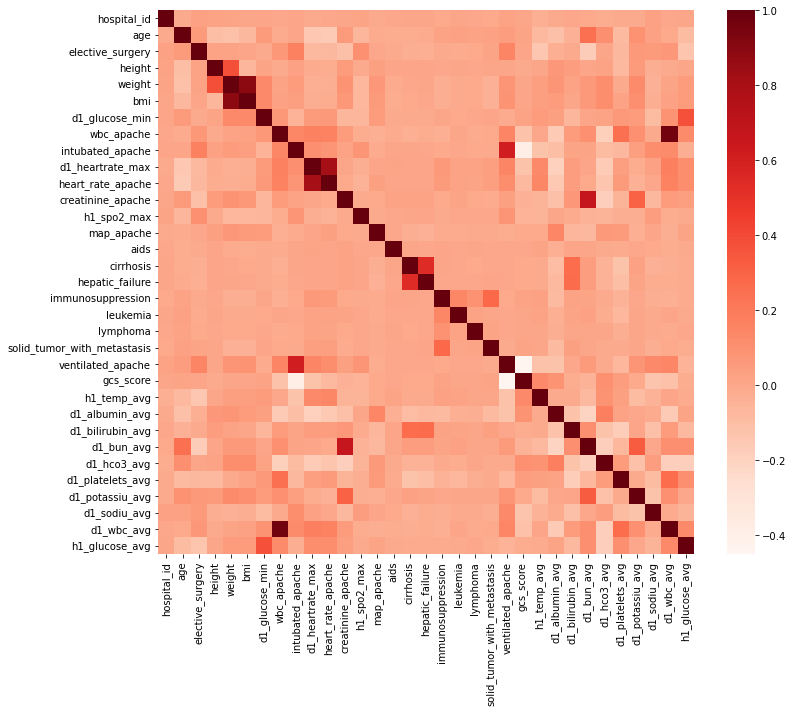

In [47]:
corr=df.loc[:,~df.columns.isin(['diabetes_mellitus','encounter_id'])].corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=False, cmap=plt.cm.Reds)
plt.show()

### - Checkpoint Saved

In [48]:
df.to_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"),index=False)


In [15]:
df=pd.read_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"))


In [16]:
 # KDE plot 
def makeKdeplotPos(df1,df2,columns):
    plt.figure(figsize=(40,45))
    i=1
    for column in columns:
        #make sure that plot only takes the two plots below by using the following command
        # produce a plot for each incomelabel so they interlink
        col=4
        row=math.ceil((len(columns)/col))
        plt.subplot(row,col,i)
        sns.kdeplot(data=df1[column],label="Positive", shade=True)
        sns.kdeplot(data=df2[column], label="Negative",shade=True)
        #include a legend
        plt.legend()
        #include a dynamic title
        plt.title("Distribution of " +column)
        i+=1

### - Define Features Data, Target Data and Numerical Data 

In [17]:
cat_columns=['hospital_id', 'gender', 'ethnicity',
       'elective_surgery', 'icu_type','intubated_apache','aids', 'cirrhosis', 
             'hepatic_failure', 'immunosuppression', 'leukemia',
       'lymphoma', 'solid_tumor_with_metastasis', 'ventilated_apache','missing_creatinine',
 'missing_h1_temp', 'missing_d1_albumin', 'missing_d1_bilirubin', 'missing_h1_glucose']
num_columns = []
for column in df.columns:
    if column not in cat_columns and column not in ['encounter_id','diabetes_mellitus']:
        num_columns.append(column)
        
num_columns

['age',
 'height',
 'weight',
 'bmi',
 'd1_glucose_min',
 'wbc_apache',
 'd1_heartrate_max',
 'heart_rate_apache',
 'creatinine_apache',
 'h1_spo2_max',
 'map_apache',
 'gcs_score',
 'h1_temp_avg',
 'd1_albumin_avg',
 'd1_bilirubin_avg',
 'd1_bun_avg',
 'd1_hco3_avg',
 'd1_platelets_avg',
 'd1_potassiu_avg',
 'd1_sodiu_avg',
 'd1_wbc_avg',
 'h1_glucose_avg']

In [18]:
def makeBoxplot(df,columns):
    plt.figure(figsize=(16,5))
    sns.boxplot(data=df[columns])
    plt.xticks(rotation=30)
    plt.show()

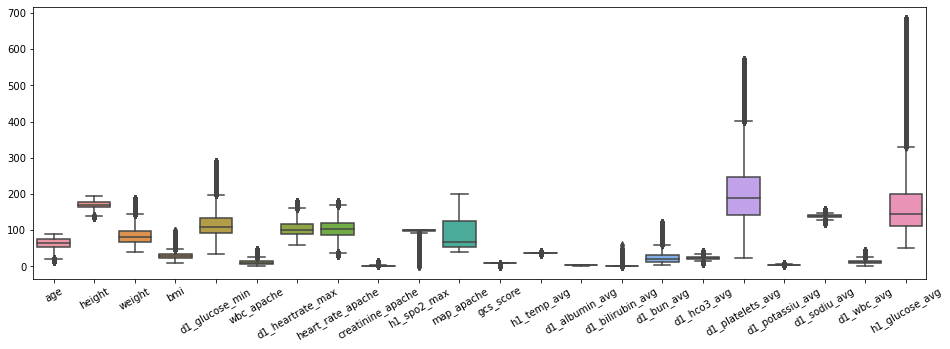

In [53]:
makeBoxplot(df,num_columns)

In [19]:
df_pos=df.loc[(df.diabetes_mellitus==1)]
df_neg=df.loc[(df.diabetes_mellitus==0)]

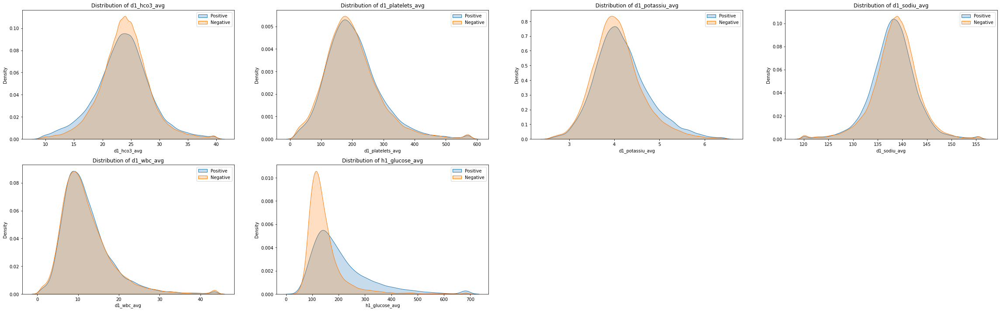

In [55]:
makeKdeplotPos(df_pos,df_neg,num_columns[16:32])

<AxesSubplot:>

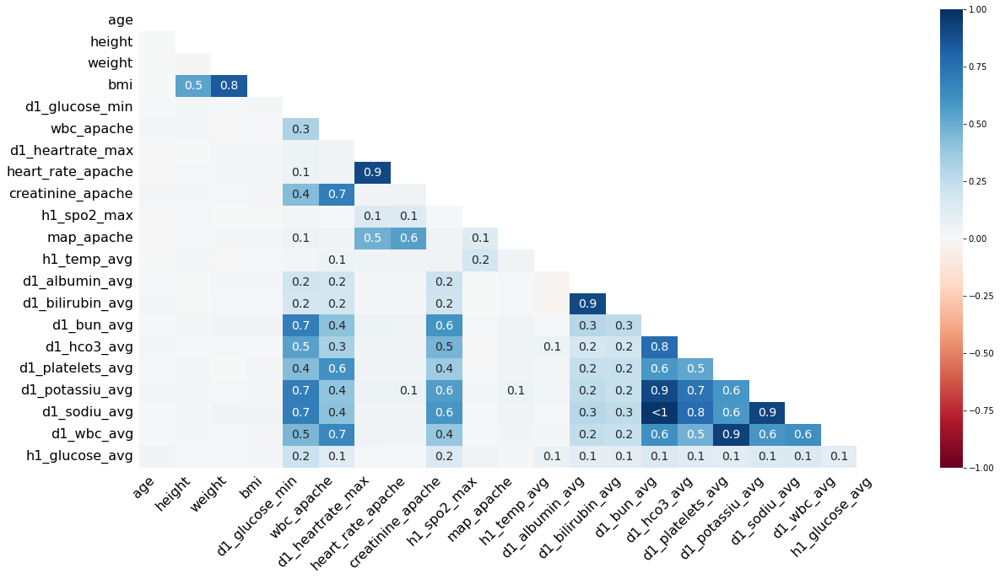

In [56]:
msno.heatmap(df, figsize=(20,10))

In [57]:
missing_values_count = pd.DataFrame(df.isna().sum())
for i in range(df.shape[1]):
    percent=missing_values_count.iloc[i,0]/df.shape[0]
    if percent>0:
        print(f"{missing_values_count.index[i].ljust(25)}---- {(percent*100).round(2)}%")

age                      ---- 3.58%
height                   ---- 0.78%
weight                   ---- 1.92%
bmi                      ---- 2.7%
d1_glucose_min           ---- 5.4%
wbc_apache               ---- 22.26%
d1_heartrate_max         ---- 0.14%
heart_rate_apache        ---- 0.16%
creatinine_apache        ---- 18.27%
h1_spo2_max              ---- 4.71%
map_apache               ---- 0.24%
h1_temp_avg              ---- 22.49%
d1_albumin_avg           ---- 54.36%
d1_bilirubin_avg         ---- 58.64%
d1_bun_avg               ---- 9.87%
d1_hco3_avg              ---- 14.91%
d1_platelets_avg         ---- 13.95%
d1_potassiu_avg          ---- 8.95%
d1_sodiu_avg             ---- 9.5%
d1_wbc_avg               ---- 13.11%
h1_glucose_avg           ---- 55.19%


In [58]:
missing_columns = {
    'creatinine_apache': 'missing_creatinine',
    'h1_temp_avg': 'missing_h1_temp',
    'd1_albumin_avg': 'missing_d1_albumin',
    'd1_bilirubin_avg': 'missing_d1_bilirubin',
    'h1_glucose_avg': 'missing_h1_glucose',
}

for column,name in missing_columns.items():
    append_column = df[column]
    append_column = append_column.isnull().astype('int')
    df[name] = append_column

### - Checkpoint Saved

In [59]:
df.to_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"),index=False)


In [8]:
df2=pd.read_csv(r"..\cmp 7023\df_1.csv".replace("\\","/"))


### Categorical Encoding

In [7]:
df2

,encounter_id,hospital_id,gender,ethnicity,age,elective_surgery,height,weight,bmi,icu_type,d1_glucose_min,wbc_apache,intubated_apache,d1_heartrate_max,heart_rate_apache,creatinine_apache,h1_spo2_max,map_apache,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ventilated_apache,diabetes_mellitus,gcs_score,h1_temp_avg,d1_albumin_avg,d1_bilirubin_avg,d1_bun_avg,d1_hco3_avg,d1_platelets_avg,d1_potassiu_avg,d1_sodiu_avg,d1_wbc_avg,h1_glucose_avg,missing_creatinine,missing_h1_temp,missing_d1_albumin,missing_d1_bilirubin,missing_h1_glucose
0,214826,118,M,Caucasian,68.0,0,180.3,73.9,22.732803,CTICU,109.0,14.1,0,119.0,118.0,2.51,100.0,40.0,0,0,0,0,0,0,0,0,1,9.0,38.5,2.3,0.4,30.5,17.0,233.0,3.70,135.0,14.1,NaN,0,0,0,0,1
1,276985,118,F,Caucasian,25.0,0,172.7,95.3,31.952749,Med-Surg ICU,NaN,NaN,0,96.0,102.0,NaN,98.0,68.0,0,0,0,0,0,0,0,0,0,9.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1,1,1
2,262220,118,F,Caucasian,81.0,1,165.1,61.7,22.635548,CTICU,88.0,8.0,1,116.0,114.0,NaN,100.0,60.0,0,0,0,0,0,0,0,1,0,10.0,35.2,NaN,NaN,NaN,NaN,120.5,4.25,NaN,8.5,NaN,1,0,1,1,1
3,201746,33,M,Caucasian,19.0,0,188.0,NaN,NaN,Med-Surg ICU,NaN,NaN,0,89.0,60.0,NaN,100.0,103.0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,1
4,246060,81,F,Caucasian,77.0,0,160.0,70.2,27.421875,Med-Surg ICU,128.0,12.7,0,118.0,120.0,0.56,95.0,46.0,0,0,0,0,0,0,0,1,1,4.0,36.3,1.6,0.5,10.0,26.5,522.0,4.00,145.0,18.0,144.0,0,0,0,0,0
5,182697,83,M,Caucasian,67.0,0,190.5,100.0,27.555611,Med-Surg ICU,125.0,10.9,0,113.0,113.0,0.71,97.0,130.0,0,0,0,0,0,0,0,0,1,10.0,36.7,NaN,NaN,13.0,27.0,159.0,3.80,137.0,10.9,NaN,0,0,1,1,1
6,195124,83,F,Caucasian,59.0,0,165.1,156.6,57.451002,Med-Surg ICU,129.0,5.9,1,112.0,133.0,0.78,100.0,138.0,0,0,0,0,0,0,0,1,1,10.0,35.9,NaN,NaN,14.5,31.5,286.5,4.60,135.5,7.6,195.5,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78563,237214,128,M,Caucasian,77.0,0,172.0,92.9,31.402109,Med-Surg ICU,118.0,21.8,1,89.0,39.0,1.47,100.0,48.0,0,0,0,0,0,0,0,1,0,3.0,37.3,2.9,0.7,23.0,22.0,NaN,3.80,140.0,NaN,255.5,0,0,0,0,0
78564,155212,164,F,Caucasian,NaN,0,149.9,49.2,21.895851,Cardiac ICU,109.0,10.1,0,92.0,97.0,1.08,100.0,61.0,0,0,0,0,0,0,0,0,0,10.0,NaN,NaN,NaN,38.0,25.5,112.0,4.10,143.0,10.1,NaN,0,1,1,1,1


In [62]:
df2["gender"] = np.where(df2["gender"].str.contains("M"), 1, 0)
df2

,encounter_id,hospital_id,gender,ethnicity,age,elective_surgery,height,weight,bmi,icu_type,d1_glucose_min,wbc_apache,intubated_apache,d1_heartrate_max,heart_rate_apache,creatinine_apache,h1_spo2_max,map_apache,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ventilated_apache,diabetes_mellitus,gcs_score,h1_temp_avg,d1_albumin_avg,d1_bilirubin_avg,d1_bun_avg,d1_hco3_avg,d1_platelets_avg,d1_potassiu_avg,d1_sodiu_avg,d1_wbc_avg,h1_glucose_avg,missing_creatinine,missing_h1_temp,missing_d1_albumin,missing_d1_bilirubin,missing_h1_glucose
0,214826,118,1,Caucasian,68.0,0,180.3,73.9,22.732803,CTICU,109.0,14.1,0,119.0,118.0,2.51,100.0,40.0,0,0,0,0,0,0,0,0,1,9.0,38.5,2.3,0.4,30.5,17.0,233.0,3.70,135.0,14.1,NaN,0,0,0,0,1
1,276985,118,0,Caucasian,25.0,0,172.7,95.3,31.952749,Med-Surg ICU,NaN,NaN,0,96.0,102.0,NaN,98.0,68.0,0,0,0,0,0,0,0,0,0,9.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1,1,1
2,262220,118,0,Caucasian,81.0,1,165.1,61.7,22.635548,CTICU,88.0,8.0,1,116.0,114.0,NaN,100.0,60.0,0,0,0,0,0,0,0,1,0,10.0,35.2,NaN,NaN,NaN,NaN,120.5,4.25,NaN,8.5,NaN,1,0,1,1,1
3,201746,33,1,Caucasian,19.0,0,188.0,NaN,NaN,Med-Surg ICU,NaN,NaN,0,89.0,60.0,NaN,100.0,103.0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,1
4,246060,81,0,Caucasian,77.0,0,160.0,70.2,27.421875,Med-Surg ICU,128.0,12.7,0,118.0,120.0,0.56,95.0,46.0,0,0,0,0,0,0,0,1,1,4.0,36.3,1.6,0.5,10.0,26.5,522.0,4.00,145.0,18.0,144.0,0,0,0,0,0
5,182697,83,1,Caucasian,67.0,0,190.5,100.0,27.555611,Med-Surg ICU,125.0,10.9,0,113.0,113.0,0.71,97.0,130.0,0,0,0,0,0,0,0,0,1,10.0,36.7,NaN,NaN,13.0,27.0,159.0,3.80,137.0,10.9,NaN,0,0,1,1,1
6,195124,83,0,Caucasian,59.0,0,165.1,156.6,57.451002,Med-Surg ICU,129.0,5.9,1,112.0,133.0,0.78,100.0,138.0,0,0,0,0,0,0,0,1,1,10.0,35.9,NaN,NaN,14.5,31.5,286.5,4.60,135.5,7.6,195.5,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78563,237214,128,1,Caucasian,77.0,0,172.0,92.9,31.402109,Med-Surg ICU,118.0,21.8,1,89.0,39.0,1.47,100.0,48.0,0,0,0,0,0,0,0,1,0,3.0,37.3,2.9,0.7,23.0,22.0,NaN,3.80,140.0,NaN,255.5,0,0,0,0,0
78564,155212,164,0,Caucasian,NaN,0,149.9,49.2,21.895851,Cardiac ICU,109.0,10.1,0,92.0,97.0,1.08,100.0,61.0,0,0,0,0,0,0,0,0,0,10.0,NaN,NaN,NaN,38.0,25.5,112.0,4.10,143.0,10.1,NaN,0,1,1,1,1


In [63]:
df2.ethnicity.value_counts()

Caucasian           60019
African American     8726
Other/Unknown        4741
Hispanic             3127
Asian                1346
Native American       611
Name: ethnicity, dtype: int64

In [64]:
from sklearn.preprocessing import OneHotEncoder
print(df2.shape)
# creating instance of one-hot-encoder
enc = OneHotEncoder(handle_unknown='ignore')
# passing body_style column
enc_df = pd.DataFrame(enc.fit_transform(df2[['icu_type']]).toarray())
# print(enc_df)
enc_df.columns = enc.get_feature_names(['ICU'])
# print(enc_df)
df2= pd.concat([df2, enc_df], axis=1)
print(df2)

(78570, 43)
       encounter_id  hospital_id  gender         ethnicity   age  \
0            214826          118       1         Caucasian  68.0   
1            276985          118       0         Caucasian  25.0   
2            262220          118       0         Caucasian  81.0   
3            201746           33       1         Caucasian  19.0   
4            246060           81       0         Caucasian  77.0   
5            182697           83       1         Caucasian  67.0   
6            195124           83       0         Caucasian  59.0   
...             ...          ...     ...               ...   ...   
78563        237214          128       1         Caucasian  77.0   
78564        155212          164       0         Caucasian   NaN   
78565        166024          146       0         Caucasian  86.0   
78566        185015          154       0         Caucasian  55.0   
78567        173688           47       1  African American  61.0   
78568        169835          120    

C:\Users\PC\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [65]:
from sklearn.preprocessing import OneHotEncoder
print(df2.shape)
# creating instance of one-hot-encoder
enc = OneHotEncoder(handle_unknown='ignore')
# passing body_style column
enc_df = pd.DataFrame(enc.fit_transform(df2[['ethnicity']]).toarray())
#print(enc_df.columns)
#df=df.join( enc_df)
print(enc_df)
enc_df.columns = enc.get_feature_names(['e'])
print(enc_df)
df2= pd.concat([df2, enc_df], axis=1)
print(df2)

(78570, 51)
         0    1    2    3    4    5
0      0.0  0.0  1.0  0.0  0.0  0.0
1      0.0  0.0  1.0  0.0  0.0  0.0
2      0.0  0.0  1.0  0.0  0.0  0.0
3      0.0  0.0  1.0  0.0  0.0  0.0
4      0.0  0.0  1.0  0.0  0.0  0.0
5      0.0  0.0  1.0  0.0  0.0  0.0
6      0.0  0.0  1.0  0.0  0.0  0.0
...    ...  ...  ...  ...  ...  ...
78563  0.0  0.0  1.0  0.0  0.0  0.0
78564  0.0  0.0  1.0  0.0  0.0  0.0
78565  0.0  0.0  1.0  0.0  0.0  0.0
78566  0.0  0.0  1.0  0.0  0.0  0.0
78567  1.0  0.0  0.0  0.0  0.0  0.0
78568  0.0  0.0  1.0  0.0  0.0  0.0
78569  0.0  0.0  1.0  0.0  0.0  0.0

[78570 rows x 6 columns]
       e_African American  e_Asian  e_Caucasian  e_Hispanic  \
0                     0.0      0.0          1.0         0.0   
1                     0.0      0.0          1.0         0.0   
2                     0.0      0.0          1.0         0.0   
3                     0.0      0.0          1.0         0.0   
4                     0.0      0.0          1.0         0.0   
5       

C:\Users\PC\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [66]:
df2.drop(columns=['ethnicity','icu_type'],inplace=True)
df2

,encounter_id,hospital_id,gender,age,elective_surgery,height,weight,bmi,d1_glucose_min,wbc_apache,intubated_apache,d1_heartrate_max,heart_rate_apache,creatinine_apache,h1_spo2_max,map_apache,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ventilated_apache,diabetes_mellitus,gcs_score,h1_temp_avg,d1_albumin_avg,d1_bilirubin_avg,d1_bun_avg,d1_hco3_avg,d1_platelets_avg,d1_potassiu_avg,d1_sodiu_avg,d1_wbc_avg,h1_glucose_avg,missing_creatinine,missing_h1_temp,missing_d1_albumin,missing_d1_bilirubin,missing_h1_glucose,ICU_CCU-CTICU,ICU_CSICU,ICU_CTICU,ICU_Cardiac ICU,ICU_MICU,ICU_Med-Surg ICU,ICU_Neuro ICU,ICU_SICU,e_African American,e_Asian,e_Caucasian,e_Hispanic,e_Native American,e_Other/Unknown
0,214826,118,1,68.0,0,180.3,73.9,22.732803,109.0,14.1,0,119.0,118.0,2.51,100.0,40.0,0,0,0,0,0,0,0,0,1,9.0,38.5,2.3,0.4,30.5,17.0,233.0,3.70,135.0,14.1,NaN,0,0,0,0,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,276985,118,0,25.0,0,172.7,95.3,31.952749,NaN,NaN,0,96.0,102.0,NaN,98.0,68.0,0,0,0,0,0,0,0,0,0,9.0,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1,1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,262220,118,0,81.0,1,165.1,61.7,22.635548,88.0,8.0,1,116.0,114.0,NaN,100.0,60.0,0,0,0,0,0,0,0,1,0,10.0,35.2,NaN,NaN,NaN,NaN,120.5,4.25,NaN,8.5,NaN,1,0,1,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,201746,33,1,19.0,0,188.0,NaN,NaN,NaN,NaN,0,89.0,60.0,NaN,100.0,103.0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,1,1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,246060,81,0,77.0,0,160.0,70.2,27.421875,128.0,12.7,0,118.0,120.0,0.56,95.0,46.0,0,0,0,0,0,0,0,1,1,4.0,36.3,1.6,0.5,10.0,26.5,522.0,4.00,145.0,18.0,144.0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,182697,83,1,67.0,0,190.5,100.0,27.555611,125.0,10.9,0,113.0,113.0,0.71,97.0,130.0,0,0,0,0,0,0,0,0,1,10.0,36.7,NaN,NaN,13.0,27.0,159.0,3.80,137.0,10.9,NaN,0,0,1,1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,195124,83,0,59.0,0,165.1,156.6,57.451002,129.0,5.9,1,112.0,133.0,0.78,100.0,138.0,0,0,0,0,0,0,0,1,1,10.0,35.9,NaN,NaN,14.5,31.5,286.5,4.60,135.5,7.6,195.5,0,0,1,1,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78563,237214,128,1,77.0,0,172.0,92.9,31.402109,118.0,21.8,1,89.0,39.0,1.47,100.0,48.0,0,0,0,0,0,0,0,1,0,3.0,37.3,2.9,0.7,23.0,22.0,NaN,3.80,140.0,NaN,255.5,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
78564,155212,164,0,NaN,0,149.9,49.2,21.895851,109.0,10.1,0,92.0,97.0,1.08,100.0,61.0,0,0,0,0,0,0,0,0,0,10.0,NaN,NaN,NaN,38.0,25.5,112.0,4.10,143.0,10.1,NaN,0,1,1,1,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


### - Checkpoint Saved

In [67]:
df2.to_csv(r"..\cmp 7023\df_2.csv".replace("\\","/"),index=False)

In [2]:
df2=pd.read_csv(r"..\cmp 7023\df_2.csv".replace("\\","/"))

## 1.3 Impute Missing Value

In [115]:
df2.columns

Index(['encounter_id', 'hospital_id', 'gender', 'age', 'elective_surgery',
       'height', 'weight', 'bmi', 'd1_glucose_min', 'wbc_apache',
       'intubated_apache', 'd1_heartrate_max', 'heart_rate_apache',
       'creatinine_apache', 'h1_spo2_max', 'map_apache', 'aids', 'cirrhosis',
       'hepatic_failure', 'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'ventilated_apache', 'diabetes_mellitus',
       'gcs_score', 'h1_temp_avg', 'd1_albumin_avg', 'd1_bilirubin_avg',
       'd1_bun_avg', 'd1_hco3_avg', 'd1_platelets_avg', 'd1_potassiu_avg',
       'd1_sodiu_avg', 'd1_wbc_avg', 'h1_glucose_avg', 'missing_creatinine',
       'missing_h1_temp', 'missing_d1_albumin', 'missing_d1_bilirubin',
       'missing_h1_glucose', 'ICU_CCU-CTICU', 'ICU_CSICU', 'ICU_CTICU',
       'ICU_Cardiac ICU', 'ICU_MICU', 'ICU_Med-Surg ICU', 'ICU_Neuro ICU',
       'ICU_SICU', 'e_African American', 'e_Asian', 'e_Caucasian',
       'e_Hispanic', 'e_Native American', 'e_Other/

In [3]:
X_1=df2[['encounter_id', 'hospital_id', 'gender', 'age', 'elective_surgery',
       'height', 'weight', 'bmi', 'd1_glucose_min', 'wbc_apache',
       'intubated_apache', 'd1_heartrate_max', 'heart_rate_apache',
       'creatinine_apache', 'h1_spo2_max', 'map_apache', 'aids', 'cirrhosis',
       'hepatic_failure', 'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'ventilated_apache',
       'gcs_score', 'h1_temp_avg', 'd1_albumin_avg', 'd1_bilirubin_avg',
       'd1_bun_avg', 'd1_hco3_avg', 'd1_platelets_avg', 'd1_potassiu_avg',
       'd1_sodiu_avg', 'd1_wbc_avg', 'h1_glucose_avg', 'missing_creatinine',
       'missing_h1_temp', 'missing_d1_albumin', 'missing_d1_bilirubin',
       'missing_h1_glucose', 'ICU_CCU-CTICU', 'ICU_CSICU', 'ICU_CTICU',
       'ICU_Cardiac ICU', 'ICU_MICU', 'ICU_Med-Surg ICU', 'ICU_Neuro ICU',
       'ICU_SICU', 'e_African American', 'e_Asian', 'e_Caucasian',
       'e_Hispanic', 'e_Native American', 'e_Other/Unknown']]
y_1=df2['diabetes_mellitus']

In [4]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split (X_1,y_1, test_size=0.33,random_state=1, stratify=y_1)

In [5]:
X_train['diabetes_mellitus']=y_train
df_X_train=X_train.copy()

In [6]:
X_test['diabetes_mellitus']=y_test
df_X_test=X_test.copy()

In [116]:
print(df_X_train.shape)
print(df_X_test.shape)

(52641, 55)
(25929, 55)


### 1.3a Impute Train Set

In [8]:
#running Multiple Imputation by Chained Equation
import miceforest as mf
kds = mf.ImputationKernel(df_X_train,
                          datasets=5,
                          save_all_iterations=True,
                          random_state=1)
#diabetes_amp=mf.ampute_data(df_temp[X_num],perc=0.25,random_state=199)
kds.mice(3)

In [9]:
kds.complete_data(1)
df3=pd.concat([kds.complete_data(i) for i in range(5)]).groupby(level=0).mean()

In [10]:
df3.isnull().sum().sum()
df3.shape

(52641, 55)

In [11]:
missing_values_count = pd.DataFrame(df_X_train.isna().sum())
missing_list=[]
for i in range(df_X_train.shape[1]):
    percent=missing_values_count.iloc[i,0]/df2.shape[0]
    if percent>0:
        missing_list.append(df_X_train.columns[i])
        print(f"{missing_values_count.index[i].ljust(25)}---- {(percent*100).round(2)}%")

age                      ---- 2.37%
height                   ---- 0.53%
weight                   ---- 1.27%
bmi                      ---- 1.8%
d1_glucose_min           ---- 3.63%
wbc_apache               ---- 14.93%
d1_heartrate_max         ---- 0.09%
heart_rate_apache        ---- 0.11%
creatinine_apache        ---- 12.27%
h1_spo2_max              ---- 3.17%
map_apache               ---- 0.16%
h1_temp_avg              ---- 15.18%
d1_albumin_avg           ---- 36.31%
d1_bilirubin_avg         ---- 39.19%
d1_bun_avg               ---- 6.62%
d1_hco3_avg              ---- 9.96%
d1_platelets_avg         ---- 9.3%
d1_potassiu_avg          ---- 6.02%
d1_sodiu_avg             ---- 6.37%
d1_wbc_avg               ---- 8.73%
h1_glucose_avg           ---- 37.04%


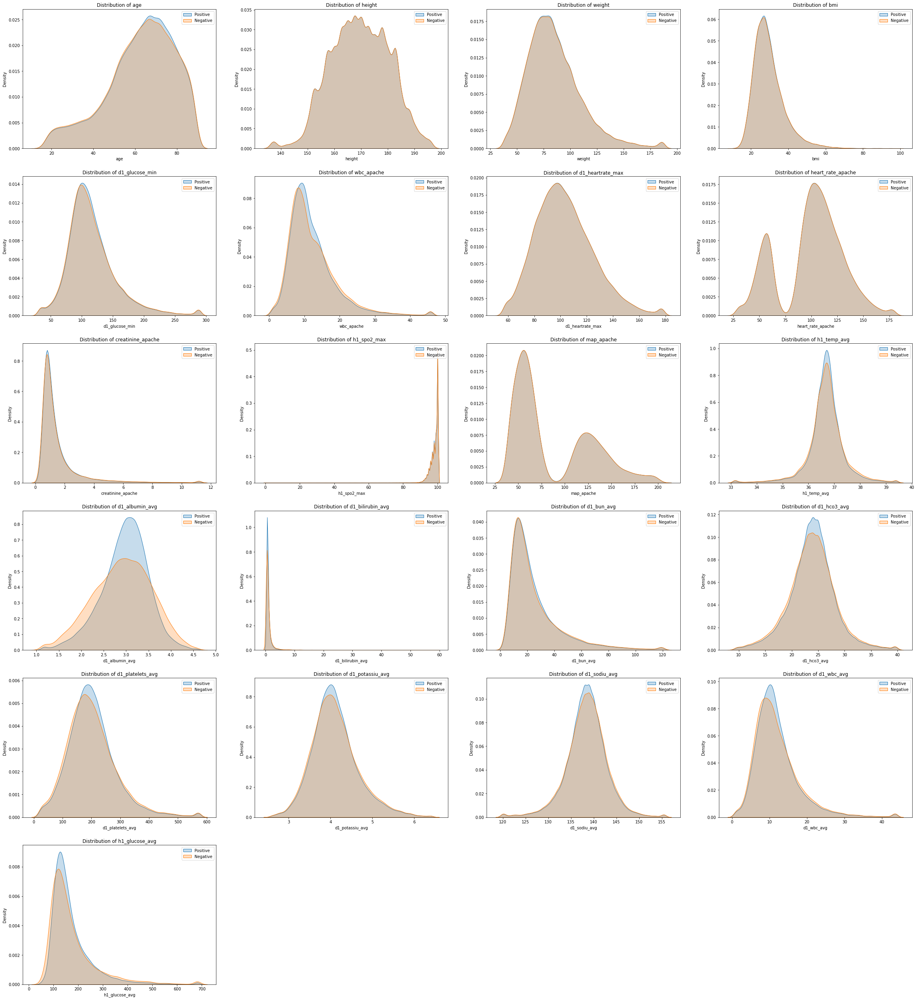

In [23]:
makeKdeplotPos(df3,df_X_train,missing_list)

In [12]:
df3.to_csv(r"..\cmp 7023\DF_NEW_IMPUTED_train.csv".replace("\\","/"),index=False)

### 1.4a Outliers Advanced

In [13]:
df3=pd.read_csv(r"..\cmp 7023\DF_NEW_IMPUTED_train.csv".replace("\\","/"))

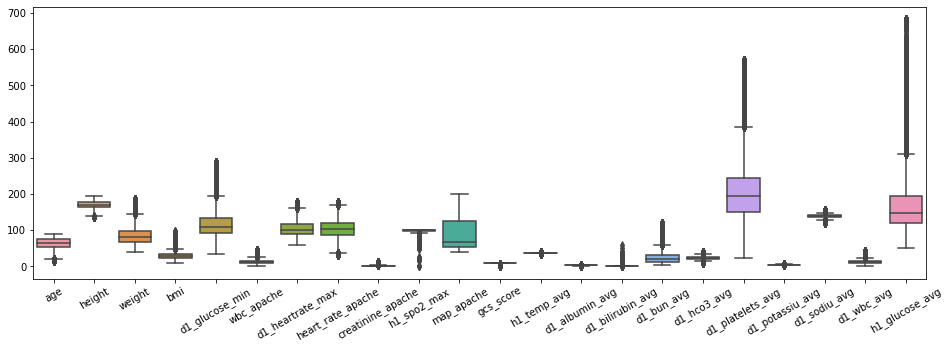

In [79]:
makeBoxplot(df3,num_columns)

In [20]:
def detect_outliers(df, columns):
    out_ls=0
    for i in columns:
        Q1 = df[i].quantile(0.25)
        Q3 = df[i].quantile(0.75)
        IQR = Q3 - Q1    #IQR is interquartile range.
#         outliers_percent = ((df[i] < (Q1 - 1.5*IQR)) | (df[i] > (Q3 + 1.5*IQR))).sum().sum()/np.product(df.shape)*100
        ls=((df[i] < Q1 - 1.5 * IQR) | (df[i] > Q3 + 1.5 *IQR)).sum()
        out_ls+=ls
        print(f'{i}: {ls}')
    print(f'Total outliers: {out_ls}')
    print(f'Missing percent: {round(out_ls/np.product(df.shape)*100,2)}%')
#         print(outliers_percent)

In [21]:
detect_outliers(df3,num_columns)

age: 454
height: 272
weight: 1572
bmi: 1937
d1_glucose_min: 2425
wbc_apache: 2333
d1_heartrate_max: 757
heart_rate_apache: 1177
creatinine_apache: 5169
h1_spo2_max: 1429
map_apache: 0
gcs_score: 8145
h1_temp_avg: 3973
d1_albumin_avg: 1408
d1_bilirubin_avg: 4655
d1_bun_avg: 3525
d1_hco3_avg: 2826
d1_platelets_avg: 1639
d1_potassiu_avg: 1669
d1_sodiu_avg: 2013
d1_wbc_avg: 2439
h1_glucose_avg: 3266
Total outliers: 53083
Missing percent: 1.83%


In [22]:
X_1=df3[num_columns]
y_1=df3['diabetes_mellitus']

In [23]:
X_1.shape

(52641, 22)

### Using DBScan Method

In [24]:
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

neighbors = 22
# X_embedded is your data
nbrs = NearestNeighbors(n_neighbors=neighbors ).fit(X_1)
distances, indices = nbrs.kneighbors(X_1)
distance_desc = sorted(distances[:,neighbors-1], reverse=True)
px.line(x=list(range(1,len(distance_desc )+1)),y= distance_desc )

111.48129848805137

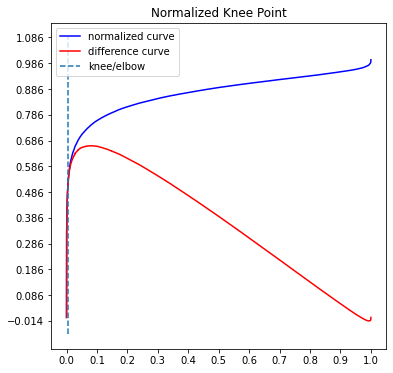

In [25]:
from kneed import KneeLocator
kneedle = KneeLocator(range(1,len(distance_desc)+1),  #x values
                      distance_desc, # y values
                      S=1.0, #parameter suggested from paper
                      curve="convex", #parameter from figure
                      direction="decreasing"
                     ) #parameter from figure

kneedle.plot_knee_normalized()
kneedle.knee_y

In [26]:
#import the implementation of this algorihm from sklearn
from sklearn.cluster import DBSCAN

#Use the algorithm for outlier detection, the retun in clusters will show the membership of each point
#Any point labelled as -1 is an outlier

outlier_detection = DBSCAN(min_samples = 22, eps = 111)
clusters = outlier_detection.fit_predict(X_1)

#Count total number of outliers as count of those labelled as -1
TotalOutliers=list(clusters).count(-1)
# print (clusters)
print("Total number of outliers identified is: ",TotalOutliers)

Total number of outliers identified is:  33


In [27]:
# select all rows that are not outliers and create a boolean mask
mask = clusters != -1
# Apply mask to y and check shape
y1= y_1[mask]
print (y1.shape)
#Apply mask to X and check shape 
X1=X_1[mask]
print(X1.shape)

(52608,)
(52608, 22)


### Using Isolation Method

In [28]:
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

In [29]:
clf = IsolationForest(max_samples=52641, random_state=1, contamination=0.0183)
preds=clf.fit_predict(X_1)
totalOutliers=0
for pred in preds:
    if pred == -1:
        totalOutliers+=1
print("Total number of outliers identified is: ",totalOutliers)


C:\Users\PC\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



Total number of outliers identified is:  964


In [30]:
# select all rows that are not outliers and create a boolean mask
mask = preds != -1
# Apply mask to y and check shape
y2= y_1[mask]
print (y2.shape)

#Apply mask to X and check shape 
X2=X_1[mask]
print(X2.shape)

(51677,)
(51677, 22)


### Using Local Outlier Factor

Number of predicted outliers: 964


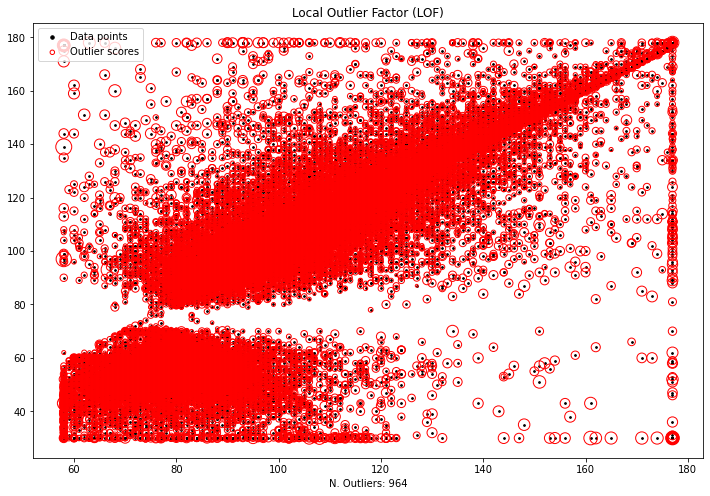

In [31]:
from sklearn.neighbors import LocalOutlierFactor
np.random.seed(42)
# fit the model for outlier detection (default)
clf = LocalOutlierFactor(n_neighbors=22, contamination=0.0183)
# use fit_predict to compute the predicted labels of the training samples
# (when LOF is used for outlier detection, the estimator has no predict,
# decision_function and score_samples methods).
y_pred = clf.fit_predict(X_1)

#print ("Predicted outliers: \n",y_pred)

#Calculate number of outliers
outlierN = len([i for i in y_pred if i == -1])
print ("Number of predicted outliers:",outlierN)

#Let us see graphically how the outliers are identified
#Use outlier scores calculated by the algorithm to plot a circle around the outlier proportional to score.

X_scores = clf.negative_outlier_factor_

plt.figure(figsize=(12,8))
plt.title("Local Outlier Factor (LOF)")

#Convert the df to an array for the purpose of the scatterplot
Xol = X_1.to_numpy()

#Use scatter 
plt.scatter(Xol[:, 6], Xol[:, 7], color='k', s=3, label='Data points')

# plot circles with radius proportional to the outlier scores
radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())
plt.scatter(Xol[:, 6], Xol[:, 7], s=300 * radius, edgecolors='r',
            facecolors='none', label='Outlier scores')
plt.axis('tight')
#plt.xlim((0, 14))
#plt.ylim((0, 6))
plt.xlabel("N. Outliers: %d" % (outlierN))
legend = plt.legend(loc='upper left')
legend.legendHandles[0]._sizes = [12]
legend.legendHandles[1]._sizes = [20]
plt.show()

In [32]:
# select all rows that are not outliers and create a boolean mask
mask = y_pred != -1
# Apply mask to y and check shape
y3= y_1[mask]
print (y3.shape)

#Apply mask to X and check shape 
X3=X_1[mask]
print(X3.shape)

(51677,)
(51677, 22)


Text(0.5, 1.0, 'Scatter plot for LOF')

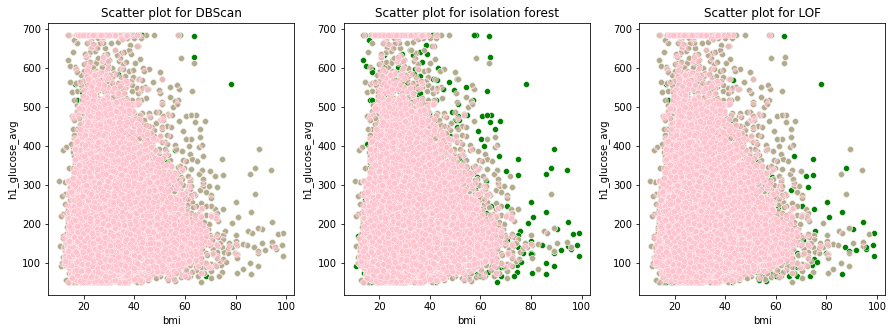

In [33]:
# Set the width and height of the figure
plt.figure(figsize=(15,5))

# Plot scatterplot for DBScan
plt.subplot(1,3,1)
sns.scatterplot(x=df3['bmi'], y=df3['h1_glucose_avg'],color='green')
sns.scatterplot(x=X1['bmi'], y=X1['h1_glucose_avg'],color='pink',alpha=.7)
plt.title('Scatter plot for DBScan')

# Plot scatter for isolation forest
plt.subplot(1,3,2)
sns.scatterplot(x=df3['bmi'], y=df3['h1_glucose_avg'],color='green')
sns.scatterplot(x=X2['bmi'], y=X2['h1_glucose_avg'],color='pink',alpha=.7)
plt.title('Scatter plot for isolation forest')

# Plot scatterplot for LOF
plt.subplot(1,3,3)
sns.scatterplot(x=df3['bmi'], y=df3['h1_glucose_avg'],color='green')
sns.scatterplot(x=X3['bmi'], y=X3['h1_glucose_avg'],color='pink',alpha=.7)
plt.title('Scatter plot for LOF')

In [70]:
df4=df3.loc[list(X2.index),:]
df4.shape

(51677, 55)

In [71]:
df4.to_csv(r"..\cmp 7023\DF_NEW_3_train.csv".replace("\\","/"),index=False)

# 2. Data Preprocessing

## 2.1a Features Construction

### Feature Selection

In [72]:
df4=pd.read_csv(r"..\cmp 7023\DF_NEW_3_train.csv".replace("\\","/"))

In [73]:
df4.columns

Index(['encounter_id', 'hospital_id', 'gender', 'age', 'elective_surgery',
       'height', 'weight', 'bmi', 'd1_glucose_min', 'wbc_apache',
       'intubated_apache', 'd1_heartrate_max', 'heart_rate_apache',
       'creatinine_apache', 'h1_spo2_max', 'map_apache', 'aids', 'cirrhosis',
       'hepatic_failure', 'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'ventilated_apache', 'gcs_score',
       'h1_temp_avg', 'd1_albumin_avg', 'd1_bilirubin_avg', 'd1_bun_avg',
       'd1_hco3_avg', 'd1_platelets_avg', 'd1_potassiu_avg', 'd1_sodiu_avg',
       'd1_wbc_avg', 'h1_glucose_avg', 'missing_creatinine', 'missing_h1_temp',
       'missing_d1_albumin', 'missing_d1_bilirubin', 'missing_h1_glucose',
       'ICU_CCU-CTICU', 'ICU_CSICU', 'ICU_CTICU', 'ICU_Cardiac ICU',
       'ICU_MICU', 'ICU_Med-Surg ICU', 'ICU_Neuro ICU', 'ICU_SICU',
       'e_African American', 'e_Asian', 'e_Caucasian', 'e_Hispanic',
       'e_Native American', 'e_Other/Unknown', 'diabetes_m

In [74]:
X_3=df4[['encounter_id', 'hospital_id', 'gender', 'age', 'elective_surgery',
       'height', 'weight', 'bmi', 'd1_glucose_min', 'wbc_apache',
       'intubated_apache', 'd1_heartrate_max', 'heart_rate_apache',
       'creatinine_apache', 'h1_spo2_max', 'map_apache', 'aids', 'cirrhosis',
       'hepatic_failure', 'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'ventilated_apache', 'gcs_score',
       'h1_temp_avg', 'd1_albumin_avg', 'd1_bilirubin_avg', 'd1_bun_avg',
       'd1_hco3_avg', 'd1_platelets_avg', 'd1_potassiu_avg', 'd1_sodiu_avg',
       'd1_wbc_avg', 'h1_glucose_avg', 'missing_creatinine', 'missing_h1_temp',
       'missing_d1_albumin', 'missing_d1_bilirubin', 'missing_h1_glucose',
       'ICU_CCU-CTICU', 'ICU_CSICU', 'ICU_CTICU', 'ICU_Cardiac ICU',
       'ICU_MICU', 'ICU_Med-Surg ICU', 'ICU_Neuro ICU', 'ICU_SICU',
       'e_African American', 'e_Asian', 'e_Caucasian', 'e_Hispanic',
       'e_Native American', 'e_Other/Unknown']]
y_3=df4['diabetes_mellitus']

In [75]:
from sklearn.feature_selection import SelectKBest, f_regression
# configure to select all features
selector = SelectKBest(score_func=f_regression, k='all')

# transform train input data
Xfs = selector.fit_transform(X_3,y_3)

#Retrieve the column names for the selected columns
names = X_3.columns.values[selector.get_support()]
#and their scores
scores = selector.scores_[selector.get_support()]
#pair the values together with the zip function
names_scores = list(zip(names, scores))
#Store the information in a data frame
ns_df = pd.DataFrame(data = names_scores, columns=['Feat_names', 'F_Scores'])
#Sort the dataframe for better visualization
ns_df_sorted = ns_df.sort_values(['F_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sorted.to_string())
#Look at shape of new data
Xfs.shape

                     Feat_names     F_Scores
34               h1_glucose_avg  8797.747832
7                           bmi  1906.456913
6                        weight  1580.434292
28                   d1_bun_avg  1517.332426
39           missing_h1_glucose  1473.078240
8                d1_glucose_min  1149.591041
13            creatinine_apache  1129.018649
3                           age   472.408262
31              d1_potassiu_avg   442.544979
50                  e_Caucasian   168.113930
46                ICU_Neuro ICU   123.517916
48           e_African American   104.513901
32                 d1_sodiu_avg    83.249944
35           missing_creatinine    76.541856
24                    gcs_score    66.661034
26               d1_albumin_avg    66.224423
29                  d1_hco3_avg    64.562311
11             d1_heartrate_max    53.922039
41                    ICU_CSICU    51.530659
27             d1_bilirubin_avg    37.815374
52            e_Native American    31.529883
47        

(51677, 54)

In [76]:
list1=ns_df_sorted.Feat_names[:20].to_list()

In [77]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif,f_classif
# configure to select all features
selector = SelectKBest(score_func=mutual_info_classif, k='all')

# transform train input data
Xfs2 = selector.fit_transform(X_3,y_3)

#Retrieve the column names for the selected columns
names = X_3.columns.values[selector.get_support()]
#and their scores
scores = selector.scores_[selector.get_support()]
#pair the values together with the zip function
names_scores = list(zip(names, scores))
#Store the information in a data frame
ns_df = pd.DataFrame(data = names_scores, columns=['Feat_names', 'F_Scores'])
#Sort the dataframe for better visualization
ns_df_sorted = ns_df.sort_values(['F_Scores', 'Feat_names'], ascending = [False, True])
print(ns_df_sorted.to_string())
#Look at shape of new data
Xfs2.shape

                     Feat_names  F_Scores
34               h1_glucose_avg  0.118515
8                d1_glucose_min  0.038022
7                           bmi  0.023213
28                   d1_bun_avg  0.022204
1                   hospital_id  0.019442
6                        weight  0.019092
13            creatinine_apache  0.017937
39           missing_h1_glucose  0.015727
3                           age  0.012043
31              d1_potassiu_avg  0.005089
29                  d1_hco3_avg  0.005072
38         missing_d1_bilirubin  0.003992
37           missing_d1_albumin  0.003862
33                   d1_wbc_avg  0.003751
24                    gcs_score  0.003414
35           missing_creatinine  0.002912
50                  e_Caucasian  0.002870
30             d1_platelets_avg  0.002666
15                   map_apache  0.002603
9                    wbc_apache  0.002594
26               d1_albumin_avg  0.002543
32                 d1_sodiu_avg  0.002271
45             ICU_Med-Surg ICU  0

(51677, 54)

In [78]:
list2=ns_df_sorted.Feat_names[:20].to_list()

In [79]:
choosen_cols=np.unique(list1+list2)
print(choosen_cols)

['ICU_CSICU' 'ICU_Neuro ICU' 'age' 'bmi' 'creatinine_apache'
 'd1_albumin_avg' 'd1_bilirubin_avg' 'd1_bun_avg' 'd1_glucose_min'
 'd1_hco3_avg' 'd1_heartrate_max' 'd1_platelets_avg' 'd1_potassiu_avg'
 'd1_sodiu_avg' 'd1_wbc_avg' 'e_African American' 'e_Caucasian'
 'gcs_score' 'h1_glucose_avg' 'hospital_id' 'map_apache'
 'missing_creatinine' 'missing_d1_albumin' 'missing_d1_bilirubin'
 'missing_h1_glucose' 'wbc_apache' 'weight']


In [80]:
X_4=X_3[choosen_cols]
X_4=X_4.reindex(sorted(X_4.columns), axis=1)

### Correlated

In [81]:
corr=X_4.corr()
corr

,ICU_CSICU,ICU_Neuro ICU,age,bmi,creatinine_apache,d1_albumin_avg,d1_bilirubin_avg,d1_bun_avg,d1_glucose_min,d1_hco3_avg,d1_heartrate_max,d1_platelets_avg,d1_potassiu_avg,d1_sodiu_avg,d1_wbc_avg,e_African American,e_Caucasian,gcs_score,h1_glucose_avg,hospital_id,map_apache,missing_creatinine,missing_d1_albumin,missing_d1_bilirubin,missing_h1_glucose,wbc_apache,weight
ICU_CSICU,1.000000,-0.059127,0.044134,0.003482,-0.030124,0.013394,-0.016329,-0.040288,-0.026415,-0.004694,-0.051605,-0.028106,0.022773,0.029098,0.013527,-0.041378,0.040516,-0.029655,-0.026826,0.095155,-0.004319,-0.050829,0.016565,0.003189,-0.087143,0.013094,0.011746
ICU_Neuro ICU,-0.059127,1.000000,-0.035698,-0.011714,-0.071644,0.093122,-0.033741,-0.092064,0.031415,0.011924,-0.027789,0.041797,-0.053752,0.024102,-0.025848,0.019615,-0.015834,-0.030005,-0.030641,0.012645,0.076092,0.061419,0.082034,0.063033,0.078309,-0.027683,-0.009902
age,0.044134,-0.035698,1.000000,-0.080697,0.069558,-0.122327,-0.022621,0.273134,0.058629,0.101756,-0.140334,-0.095107,0.104044,0.026827,-0.006106,-0.114273,0.134111,0.017391,-0.025054,-0.010185,-0.019423,-0.012452,0.020239,0.027660,0.007857,-0.006403,-0.125341
bmi,0.003482,-0.011714,-0.080697,1.000000,0.058243,0.065296,-0.011848,0.048960,0.136169,0.125566,-0.033131,0.024966,0.098391,-0.017861,0.018065,0.045827,-0.000253,0.018742,0.090957,0.003439,0.062558,0.005245,0.005592,0.005108,-0.029470,0.019058,0.890092
creatinine_apache,-0.030124,-0.071644,0.069558,0.058243,1.000000,-0.142989,0.063831,0.671507,-0.062506,-0.167502,-0.005663,-0.063047,0.306851,-0.065297,0.034932,0.143845,-0.120162,-0.018946,0.065528,0.002534,-0.007275,-0.030982,-0.102984,-0.071330,-0.044469,0.036015,0.074018
d1_albumin_avg,0.013394,0.093122,-0.122327,0.065296,-0.142989,1.000000,-0.154408,-0.247453,0.035041,0.179785,-0.228480,0.027402,-0.032507,-0.027747,-0.163766,0.015062,0.002342,0.080542,-0.035078,-0.007988,0.193774,0.063989,0.099122,0.094296,0.035432,-0.163547,0.095643
d1_bilirubin_avg,-0.016329,-0.033741,-0.022621,-0.011848,0.063831,-0.154408,1.000000,0.095853,-0.048299,-0.110422,0.051935,-0.196568,0.019698,-0.108593,0.027443,-0.000969,-0.014987,-0.015230,-0.030303,-0.001279,-0.066621,-0.029365,-0.046584,-0.048133,-0.021555,0.029387,0.006632
d1_bun_avg,-0.040288,-0.092064,0.273134,0.048960,0.671507,-0.247453,0.095853,1.000000,0.005909,-0.159356,-0.001336,-0.082637,0.328989,0.003975,0.078398,0.034014,-0.016781,-0.024923,0.129382,-0.006237,-0.069846,-0.040017,-0.118052,-0.090565,-0.041667,0.075734,0.049830
d1_glucose_min,-0.026415,0.031415,0.058629,0.136169,-0.062506,0.035041,-0.048299,0.005909,1.000000,0.031708,0.055085,0.057857,0.053857,-0.095050,0.080492,-0.018433,0.015147,0.033017,0.491760,0.010459,0.063858,0.039975,0.045347,0.037990,0.111816,0.075024,0.136551
d1_hco3_avg,-0.004694,0.011924,0.101756,0.125566,-0.167502,0.179785,-0.110422,-0.159356,0.031708,1.000000,-0.152031,0.044083,-0.096529,0.042690,-0.163354,-0.032836,0.041831,0.080222,-0.134803,-0.014727,0.058962,0.087095,0.085807,0.078814,0.107250,-0.164643,0.122991


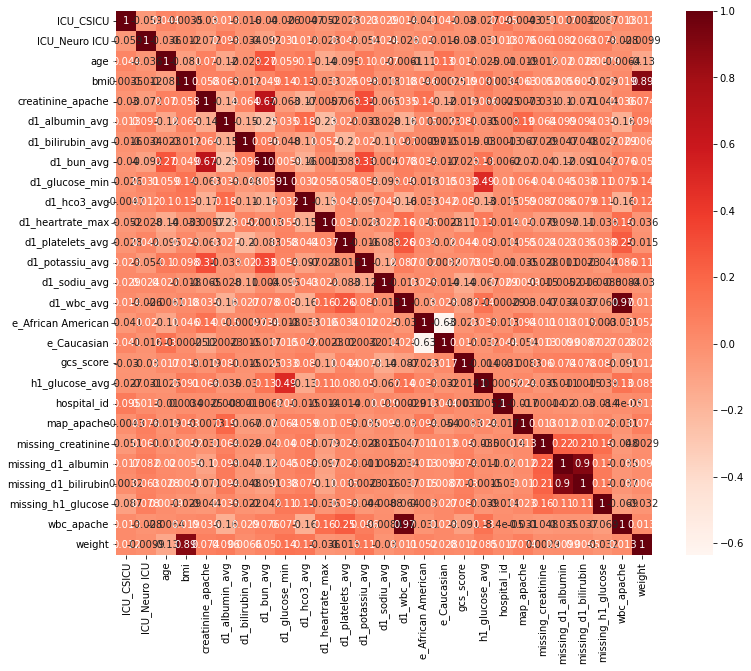

In [82]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True, cmap=plt.cm.Reds)
plt.show()

In [85]:
X_4.drop(columns=['weight','wbc_apache','missing_d1_bilirubin'
                 ],inplace=True)

In [86]:
corr=X_4.corr()
corr

,ICU_CSICU,ICU_Neuro ICU,age,bmi,creatinine_apache,d1_albumin_avg,d1_bilirubin_avg,d1_bun_avg,d1_glucose_min,d1_hco3_avg,d1_heartrate_max,d1_platelets_avg,d1_potassiu_avg,d1_sodiu_avg,d1_wbc_avg,e_African American,e_Caucasian,gcs_score,h1_glucose_avg,hospital_id,map_apache,missing_creatinine,missing_d1_albumin,missing_h1_glucose
ICU_CSICU,1.000000,-0.059127,0.044134,0.003482,-0.030124,0.013394,-0.016329,-0.040288,-0.026415,-0.004694,-0.051605,-0.028106,0.022773,0.029098,0.013527,-0.041378,0.040516,-0.029655,-0.026826,0.095155,-0.004319,-0.050829,0.016565,-0.087143
ICU_Neuro ICU,-0.059127,1.000000,-0.035698,-0.011714,-0.071644,0.093122,-0.033741,-0.092064,0.031415,0.011924,-0.027789,0.041797,-0.053752,0.024102,-0.025848,0.019615,-0.015834,-0.030005,-0.030641,0.012645,0.076092,0.061419,0.082034,0.078309
age,0.044134,-0.035698,1.000000,-0.080697,0.069558,-0.122327,-0.022621,0.273134,0.058629,0.101756,-0.140334,-0.095107,0.104044,0.026827,-0.006106,-0.114273,0.134111,0.017391,-0.025054,-0.010185,-0.019423,-0.012452,0.020239,0.007857
bmi,0.003482,-0.011714,-0.080697,1.000000,0.058243,0.065296,-0.011848,0.048960,0.136169,0.125566,-0.033131,0.024966,0.098391,-0.017861,0.018065,0.045827,-0.000253,0.018742,0.090957,0.003439,0.062558,0.005245,0.005592,-0.029470
creatinine_apache,-0.030124,-0.071644,0.069558,0.058243,1.000000,-0.142989,0.063831,0.671507,-0.062506,-0.167502,-0.005663,-0.063047,0.306851,-0.065297,0.034932,0.143845,-0.120162,-0.018946,0.065528,0.002534,-0.007275,-0.030982,-0.102984,-0.044469
d1_albumin_avg,0.013394,0.093122,-0.122327,0.065296,-0.142989,1.000000,-0.154408,-0.247453,0.035041,0.179785,-0.228480,0.027402,-0.032507,-0.027747,-0.163766,0.015062,0.002342,0.080542,-0.035078,-0.007988,0.193774,0.063989,0.099122,0.035432
d1_bilirubin_avg,-0.016329,-0.033741,-0.022621,-0.011848,0.063831,-0.154408,1.000000,0.095853,-0.048299,-0.110422,0.051935,-0.196568,0.019698,-0.108593,0.027443,-0.000969,-0.014987,-0.015230,-0.030303,-0.001279,-0.066621,-0.029365,-0.046584,-0.021555
d1_bun_avg,-0.040288,-0.092064,0.273134,0.048960,0.671507,-0.247453,0.095853,1.000000,0.005909,-0.159356,-0.001336,-0.082637,0.328989,0.003975,0.078398,0.034014,-0.016781,-0.024923,0.129382,-0.006237,-0.069846,-0.040017,-0.118052,-0.041667
d1_glucose_min,-0.026415,0.031415,0.058629,0.136169,-0.062506,0.035041,-0.048299,0.005909,1.000000,0.031708,0.055085,0.057857,0.053857,-0.095050,0.080492,-0.018433,0.015147,0.033017,0.491760,0.010459,0.063858,0.039975,0.045347,0.111816
d1_hco3_avg,-0.004694,0.011924,0.101756,0.125566,-0.167502,0.179785,-0.110422,-0.159356,0.031708,1.000000,-0.152031,0.044083,-0.096529,0.042690,-0.163354,-0.032836,0.041831,0.080222,-0.134803,-0.014727,0.058962,0.087095,0.085807,0.107250


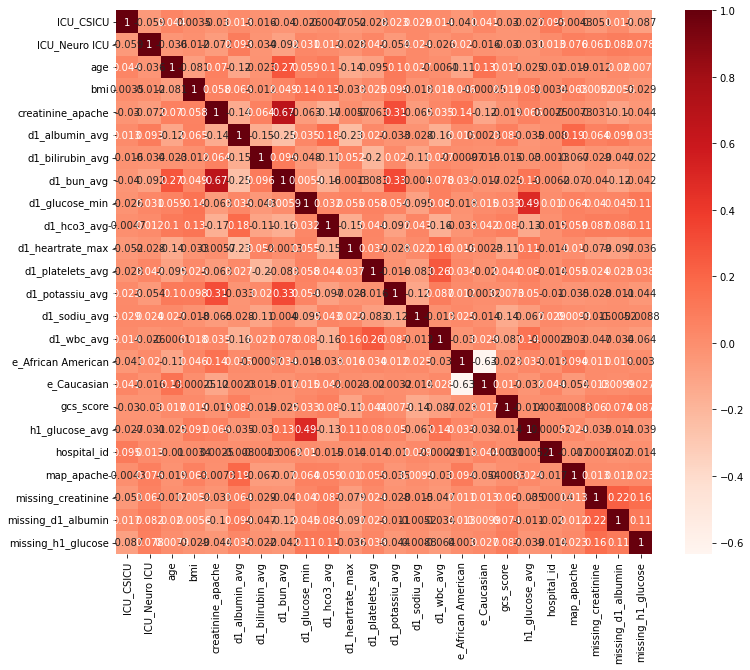

In [87]:
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True, cmap=plt.cm.Reds)
# sns.heatmap(corr, annot=False, cmap='RdYlGn')
plt.show()

In [88]:
X_4.shape

(51677, 24)

In [89]:
X_4['diabetes_mellitus']=y_3

In [90]:
X_4.to_csv(r"..\cmp 7023\SELECTED_FEATURES_train.csv".replace("\\","/"),index=False)

X_test_2=df_X_test.copy()

#if drop all the NaN value
df_X_test.dropna().shape

X_test_2=X_test_2[choosen_cols]
X_test_2=X_test_2.reindex(sorted(X_test_2.columns), axis=1)

X_test_2.drop(columns=['weight'],inplace=True)

X_test_2['diabetes_mellitus']=y_test

X_test_2.reset_index(drop=True,inplace=True)
X_test_2

X_test_2.dropna(inplace=True)
X_test_2.shape

y_test_2=y_test.iloc[list(X_test_2.index)]

X_test_2.shape

missing_values_count = pd.DataFrame(X_test_2.isna().sum())
missing_list=[]
for i in range(X_test_2.shape[1]):
    percent=missing_values_count.iloc[i,0]/X_test_2.shape[0]
    if percent>0:
        missing_list.append(X_test_2.columns[i])
        print(f"{missing_values_count.index[i].ljust(25)}---- {(percent*100).round(2)}%")

for column in missing_list:
    X_test_2[column].fillna(int(X_4[column].median()), inplace=True)
    
X_test_2.isna().sum().sum()

X_test_2.shape

y_test.shape

### 1.3b Test set Construction

In [265]:
#running Multiple Imputation by Chained Equation
import miceforest as mf
kds = mf.ImputationKernel(df_X_test,
                          datasets=5,
                          save_all_iterations=True,
                          random_state=1)
#diabetes_amp=mf.ampute_data(df_temp[X_num],perc=0.25,random_state=199)
kds.mice(3)

In [266]:
kds.complete_data(1)
df3=pd.concat([kds.complete_data(i) for i in range(5)]).groupby(level=0).mean()

In [267]:
df3.isnull().sum().sum()

0

In [268]:
df3.shape

(25929, 55)

In [183]:
missing_values_count = pd.DataFrame(df_X_test.isna().sum())
missing_list=[]
for i in range(df_X_test.shape[1]):
    percent=missing_values_count.iloc[i,0]/df3.shape[0]
    if percent>0:
        missing_list.append(df_X_test.columns[i])
        print(f"{missing_values_count.index[i].ljust(25)}---- {(percent*100).round(2)}%")

age                      ---- 3.66%
height                   ---- 0.76%
weight                   ---- 1.96%
bmi                      ---- 2.72%
d1_glucose_min           ---- 5.36%
wbc_apache               ---- 22.2%
d1_heartrate_max         ---- 0.14%
heart_rate_apache        ---- 0.15%
creatinine_apache        ---- 18.17%
h1_spo2_max              ---- 4.66%
map_apache               ---- 0.24%
h1_temp_avg              ---- 22.16%
d1_albumin_avg           ---- 54.69%
d1_bilirubin_avg         ---- 58.95%
d1_bun_avg               ---- 9.86%
d1_hco3_avg              ---- 15.01%
d1_platelets_avg         ---- 14.1%
d1_potassiu_avg          ---- 8.87%
d1_sodiu_avg             ---- 9.5%
d1_wbc_avg               ---- 13.27%
h1_glucose_avg           ---- 55.01%


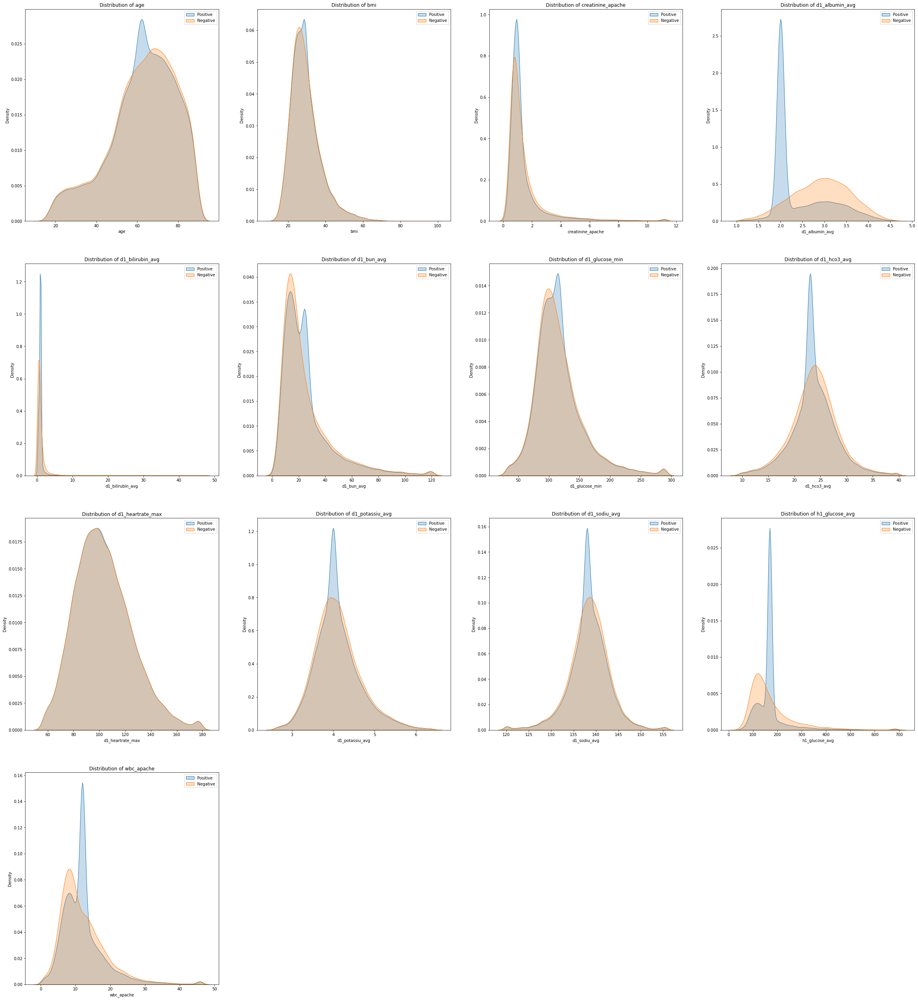

In [149]:
makeKdeplotPos(df3,df_X_test,missing_list)

In [269]:
df3.to_csv(r"..\cmp 7023\DF_NEW_IMPUTED_test.csv".replace("\\","/"),index=False)

### Feature Selection

In [91]:
df4=pd.read_csv(r"..\cmp 7023\DF_NEW_IMPUTED_test.csv".replace("\\","/"))

In [92]:
X_4=df4[choosen_cols]
X_4=X_4.reindex(sorted(X_4.columns), axis=1)

In [93]:
X_4.drop(columns=['weight','wbc_apache','missing_d1_bilirubin'
                 ],inplace=True)

In [94]:
X_4['diabetes_mellitus']=y_3

In [95]:
X_4.to_csv(r"..\cmp 7023\SELECTED_FEATURES_2_test.csv".replace("\\","/"),index=False)

# 3. Classification

In [117]:
X_test_set=pd.read_csv(r"..\cmp 7023\SELECTED_FEATURES_2_test.csv".replace("\\","/"))
X_test=X_test_set.iloc[:,:-1]
y_test=X_test_set.iloc[:,-1]
y_test

0        1.0
1        0.0
2        0.0
3        1.0
4        1.0
5        1.0
6        1.0
        ... 
25922    0.0
25923    0.0
25924    0.0
25925    0.0
25926    0.0
25927    0.0
25928    0.0
Name: diabetes_mellitus, Length: 25929, dtype: float64

In [97]:
X_train_set=pd.read_csv(r"..\cmp 7023\SELECTED_FEATURES_train.csv".replace("\\","/"))
X_train=X_train_set.iloc[:,:-1]
y_train=X_train_set.iloc[:,-1]
y_train

0        1.0
1        0.0
2        0.0
3        1.0
4        1.0
5        1.0
6        1.0
        ... 
51670    0.0
51671    0.0
51672    0.0
51673    0.0
51674    0.0
51675    0.0
51676    0.0
Name: diabetes_mellitus, Length: 51677, dtype: float64

In [98]:
y_train.value_counts()

0.0    33318
1.0    18359
Name: diabetes_mellitus, dtype: int64

### 3.1 Downsample 

In [99]:
from sklearn.utils import resample

#The first thing is contatenate our training data back together.  
resampling = X_train.copy()
resampling['diabetes_mellitus']= y_train.values

# separate minority and majority classes
majority_class = resampling[resampling['diabetes_mellitus']==0]
minority_class = resampling[resampling['diabetes_mellitus']==1]

# Downsample majority class
majority_downsampled = resample(majority_class, 
                                 replace=True,     # sample with replacement
                                 n_samples=18359,     # to match majority class
                                 random_state=123) # reproducible results

# Combine majority class with upsampled minority class
downsampled = pd.concat([minority_class, majority_downsampled])

# Show dataset statistics
print(downsampled.describe())
 
# Display new class counts
# upsampled.diabetes_mellitus.value_counts()

          ICU_CSICU  ICU_Neuro ICU           age           bmi  \
count  36718.000000   36718.000000  36718.000000  36718.000000   
mean       0.041369       0.075031     63.154780     29.959553   
std        0.199146       0.263445     15.852243      8.232788   
min        0.000000       0.000000     16.000000     11.543685   
25%        0.000000       0.000000     54.000000     24.341758   
50%        0.000000       0.000000     65.000000     28.540452   
75%        0.000000       0.000000     75.000000     33.933518   
max        1.000000       1.000000     89.000000     90.311010   

       creatinine_apache  d1_albumin_avg  d1_bilirubin_avg    d1_bun_avg  \
count       36718.000000    36718.000000      36718.000000  36718.000000   
mean            1.542496        2.973795          0.975629     25.570114   
std             1.490928        0.513678          1.262569     18.707846   
min             0.300000        1.150000          0.200000      3.500000   
25%             0.768000 

In [100]:
X_5=downsampled.copy()
X_5.columns

Index(['ICU_CSICU', 'ICU_Neuro ICU', 'age', 'bmi', 'creatinine_apache',
       'd1_albumin_avg', 'd1_bilirubin_avg', 'd1_bun_avg', 'd1_glucose_min',
       'd1_hco3_avg', 'd1_heartrate_max', 'd1_platelets_avg',
       'd1_potassiu_avg', 'd1_sodiu_avg', 'd1_wbc_avg', 'e_African American',
       'e_Caucasian', 'gcs_score', 'h1_glucose_avg', 'hospital_id',
       'map_apache', 'missing_creatinine', 'missing_d1_albumin',
       'missing_h1_glucose', 'diabetes_mellitus'],
      dtype='object')

In [101]:
X_5.to_csv(r"..\cmp 7023\SELECTED_FEATURES_3_train.csv".replace("\\","/"),index=False)

In [102]:
X_5=pd.read_csv(r"..\cmp 7023\SELECTED_FEATURES_3_train.csv".replace("\\","/"))

In [103]:
X_train=X_5[['ICU_CSICU', 'ICU_Neuro ICU', 'age', 'bmi', 'creatinine_apache',
       'd1_albumin_avg', 'd1_bilirubin_avg', 'd1_bun_avg', 'd1_glucose_min',
       'd1_hco3_avg', 'd1_heartrate_max', 'd1_platelets_avg',
       'd1_potassiu_avg', 'd1_sodiu_avg', 'd1_wbc_avg', 'e_African American',
       'e_Caucasian', 'gcs_score', 'h1_glucose_avg', 'hospital_id',
       'map_apache', 'missing_creatinine', 'missing_d1_albumin',
       'missing_h1_glucose',]]
y_train=X_5['diabetes_mellitus']

In [112]:
y_test.shape

(25929,)

In [104]:
from sklearn.preprocessing import LabelEncoder, StandardScaler,Normalizer,PowerTransformer,QuantileTransformer,MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_validate, ParameterGrid
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score,  f1_score, classification_report, ConfusionMatrixDisplay, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, mutual_info_classif,f_classif



### 3.2 Classifiers Collection

In [105]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score, precision_score, recall_score,  f1_score

pipeline = Pipeline([
    ('normalizer', StandardScaler()), #Step1 - normalize data
    ('clf', RandomForestClassifier()) #step2 - classifier
])
pipeline.steps

[('normalizer', StandardScaler()), ('clf', RandomForestClassifier())]

In [127]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,RandomForestRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate

clfs = []
clfs.append(LogisticRegression())
clfs.append(SVC())
clfs.append(MLPClassifier())
clfs.append(KNeighborsClassifier(n_neighbors=3))
clfs.append(DecisionTreeClassifier())
clfs.append(RandomForestClassifier())

for classifier in clfs:
    pipeline.set_params(clf = classifier)
    scores = cross_validate(pipeline, X_train, y_train, scoring='recall',n_jobs=-1)
    print('---------------------------------')
    print(str(classifier))
    print('-----------------------------------')
    for key, values in scores.items():
            print(key,' mean ', values.mean())
            print(key,' std ', values.std())

---------------------------------
LogisticRegression()
-----------------------------------
fit_time  mean  0.07852745056152344
fit_time  std  0.0
score_time  mean  0.009375286102294923
score_time  std  0.007654889047743031
test_score  mean  0.6807696282153363
test_score  std  0.007188408458230291
---------------------------------
SVC()
-----------------------------------
fit_time  mean  53.29557094573975
fit_time  std  0.9893517539896666
score_time  mean  11.222853946685792
score_time  std  0.2152233627984594
test_score  mean  0.738822504926963
test_score  std  0.018430887230377724
---------------------------------
MLPClassifier()
-----------------------------------
fit_time  mean  20.255033206939697
fit_time  std  0.08487164390770512
score_time  mean  0.015529632568359375
score_time  std  0.003919119425300383
test_score  mean  0.7275651450845805
test_score  std  0.022435152550085134
---------------------------------
KNeighborsClassifier(n_neighbors=3)
---------------------------------

In [106]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,plot_confusion_matrix,accuracy_score,f1_score,recall_score,precision_score,classification_report

# Defining classifiers

clf_nn = KNeighborsClassifier(n_neighbors=16)
clf_svm = SVC(random_state=1)
clf_tree = DecisionTreeClassifier(random_state=1)
clf_logit = LogisticRegression(random_state=1,max_iter=300)
clf_mlp = MLPClassifier(random_state=1,max_iter=300)
clf_random = RandomForestClassifier(random_state=1)

# List the classifiers
clfs = [clf_nn, clf_svm, clf_tree, clf_logit, clf_mlp, clf_random]

# Fit classifiers to the data
for clf in clfs:
    clf.fit(X_train, y_train)

# Get the predictions for each classifier on the validation data
clf_preds = [clf.predict(X_test) for clf in clfs]

# Get the accuracy score for each classifer
accs = [accuracy_score(y_test, clf_p) for clf_p in clf_preds]
f1 = [f1_score(y_test, clf_p) for clf_p in clf_preds]
recall = [recall_score(y_test, clf_p) for clf_p in clf_preds]
precision = [precision_score(y_test, clf_p) for clf_p in clf_preds]

# Get the index of the best accuracy
index = np.argmax(accs)

print("Best classifier is:", clfs[index], "with:\n")
print('Accuracy:', accs[index])
print('F1 score:', f1[index])
print('Recall:', recall[index])
print('Precision:', precision[index])

np.sort(accs)

C:\Users\PC\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Best classifier is: RandomForestClassifier(random_state=1) with:

Accuracy: 0.6046125959350535
F1 score: 0.6720619282195637
Recall: 0.5722300904237935
Precision: 0.8140886546807191


array([0.54093872, 0.55505419, 0.56076208, 0.56882255, 0.58274519,
       0.6046126 ])

Fitting 3 folds for each of 10 candidates, totalling 30 fits
{'transformer': StandardScaler(), 'clf': RandomForestClassifier(bootstrap=False, max_depth=100, min_samples_split=5,
                       n_estimators=500)}
              precision    recall  f1-score   support

         0.0       0.38      0.65      0.48      7188
         1.0       0.82      0.60      0.69     18741

    accuracy                           0.61     25929
   macro avg       0.60      0.62      0.58     25929
weighted avg       0.69      0.61      0.63     25929



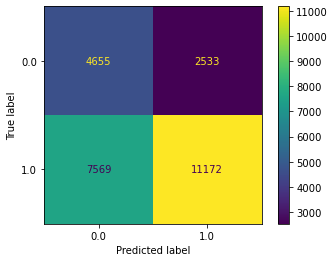

In [69]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif,f_classif
from sklearn.preprocessing import MinMaxScaler, Normalizer, PowerTransformer, QuantileTransformer, StandardScaler
from sklearn.model_selection import RandomizedSearchCV

process = [("selector",SelectKBest()),("transformer", Normalizer()), ("clf", RandomForestClassifier())]

# Build the parameter grid

slt_params = [
    (SelectKBest, {"score_func": [f_classif,mutual_info_classif], "k": [k for k in range(10,22)]}),
    (PCA, {"n_components": [5,10]})
]

slts = [ctor(**para) for ctor, paras in slt_params for para in ParameterGrid(paras)]
     
clf_params = [
    (RandomForestClassifier, {'n_estimators': [200,400,500],
                             'max_depth': [60,80,100],
                             'bootstrap':[False],
                            'min_samples_split': [2,5,7],
                             }),
]
            
clfs = [ctor(**para) for ctor, paras in clf_params for para in ParameterGrid(paras)]

trans = [Normalizer(),StandardScaler(),PowerTransformer()]

params = dict(
    transformer = trans,
#     selector = slts,
    clf = clfs
)

# Use our pipeline and the parameter grid with RandomizedSearchCV
clf = RandomizedSearchCV(Pipeline(process), param_distributions=params,
                         cv=3, verbose=3, n_jobs=-1, scoring = 'recall')
clf.fit(X_train, y_train);

# Show the best parameters
print(clf.best_params_)

# Collect predictions on validation data
y_preds = clf.predict(X_test)

print(classification_report(y_test, y_preds))
cm=confusion_matrix(y_test,y_preds,labels=clf.classes_)
ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot()
plt.show()

In [134]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

         0.0       0.88      0.64      0.74     16685
         1.0       0.57      0.84      0.68      9244

    accuracy                           0.71     25929
   macro avg       0.72      0.74      0.71     25929
weighted avg       0.77      0.71      0.72     25929



In [139]:
process = [("selector", SelectKBest()), ("transformer", StandardScaler()), ("clf", MLPClassifier())]

# Build the parameter grid

slt_params = [
    (SelectKBest, {"score_func": [f_classif,mutual_info_classif], "k": [k for k in range(10,22)]}),
    (PCA, {"n_components": [5,10,20]})
]

slts = [ctor(**para) for ctor, paras in slt_params for para in ParameterGrid(paras)]
     
clf_params = [
    (MLPClassifier, {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,50,50)],
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['lbfgs','sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    'max_iter':[500],
        }
    ),
]
            
clfs = [ctor(**para) for ctor, paras in clf_params for para in ParameterGrid(paras)]

trans = ["passthrough",StandardScaler(), MinMaxScaler(), Normalizer(), PowerTransformer(), QuantileTransformer()]

params = dict(
    transformer = trans,
    selector = slts,
    clf = clfs
)

# Use our pipeline and the parameter grid with RandomizedSearchCV
clf = RandomizedSearchCV(Pipeline(process), params,scoring='recall',n_jobs=-1,cv=3)
clf.fit(X_train, y_train);

# Show the best parameters
print(clf.best_params_)

# Collect predictions on validation data
y_preds = clf.predict(X_test)

# Print classification report

print(classification_report(y_test, y_preds))
cm=confusion_matrix(y_test,y_preds,labels=clf.classes_)
ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot()
plt.show()

{'transformer': QuantileTransformer(), 'selector': SelectKBest(k=11,
            score_func=<function mutual_info_classif at 0x00000270EDFB0160>), 'clf': MLPClassifier(activation='tanh', alpha=0.05, hidden_layer_sizes=(100, 50, 50),
              learning_rate='adaptive', max_iter=500, solver='sgd')}
              precision    recall  f1-score   support

         0.0       0.87      0.70      0.78     16685
         1.0       0.60      0.81      0.69      9244

    accuracy                           0.74     25929
   macro avg       0.73      0.76      0.73     25929
weighted avg       0.77      0.74      0.75     25929



              precision    recall  f1-score   support

         0.0       0.87      0.70      0.78     16685
         1.0       0.60      0.81      0.69      9244

    accuracy                           0.74     25929
   macro avg       0.73      0.76      0.73     25929
weighted avg       0.77      0.74      0.75     25929



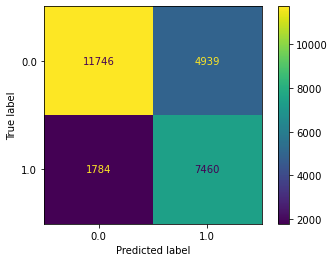

In [142]:
y_preds = clf.predict(X_test)

# Print classification report

print(classification_report(y_test, y_preds))
cm=confusion_matrix(y_test,y_preds,labels=clf.classes_)
ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot()
plt.show()

C:\Users\PC\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning:


3 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\PC\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\PC\anaconda3\lib\site-packages\sklearn\pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\PC\anaconda3\lib\site-packages\sklearn\svm\_base.py", line 198, in fit
    raise ValueError(
ValueError: Precomputed matrix must be a square matrix. Inp

{'transformer': PowerTransformer(), 'selector': SelectKBest(k=18), 'clf': SVC(C=10)}
              precision    recall  f1-score   support

         0.0       0.86      0.71      0.77     16685
         1.0       0.60      0.79      0.68      9244

    accuracy                           0.74     25929
   macro avg       0.73      0.75      0.73     25929
weighted avg       0.77      0.74      0.74     25929



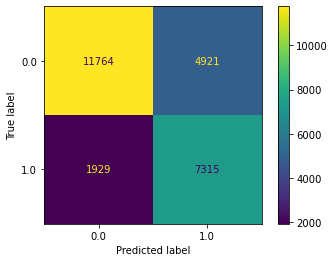

AttributeError: predict_proba is not available when  probability=False

In [151]:
from sklearn.svm import SVC
from scipy.stats import reciprocal, uniform

process = [("selector", SelectKBest()), ("transformer", StandardScaler()), ("clf", SVC())]

# Build the parameter grid

slt_params = [
    (SelectKBest, {"score_func": [f_classif,mutual_info_classif], "k": [k for k in range(10,22)]}),
    (PCA, {"n_components": [5,10,20]})
]

slts = [ctor(**para) for ctor, paras in slt_params for para in ParameterGrid(paras)]
     
clf_params = [
    (SVC, {
           "kernel": ["linear","poly", "rbf", "sigmoid", "precomputed"], "C": [0.1, 1.0, 10]
        }
    ),
]
            
clfs = [ctor(**para) for ctor, paras in clf_params for para in ParameterGrid(paras)]

trans = ["passthrough",StandardScaler(), MinMaxScaler(), Normalizer(), PowerTransformer(), QuantileTransformer()]

params = dict(
    transformer = trans,
    selector = slts,
    clf = clfs
)

# Use our pipeline and the parameter grid with RandomizedSearchCV
clf = RandomizedSearchCV(Pipeline(process), params,scoring='recall',n_jobs=-1,cv=3)
clf.fit(X_train, y_train);

# Show the best parameters
print(clf.best_params_)

# Collect predictions on validation data
y_preds = clf.predict(X_test)

# Print classification report

print(classification_report(y_test, y_preds))
cm=confusion_matrix(y_test,y_preds,labels=clf.classes_)
ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot()
plt.show()


              precision    recall  f1-score   support

         0.0       0.37      0.70      0.49      7188
         1.0       0.83      0.55      0.66     18741

    accuracy                           0.59     25929
   macro avg       0.60      0.62      0.57     25929
weighted avg       0.70      0.59      0.61     25929



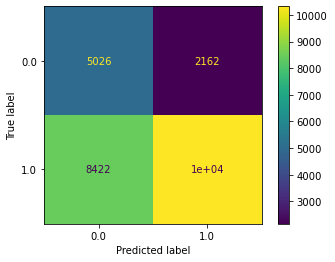

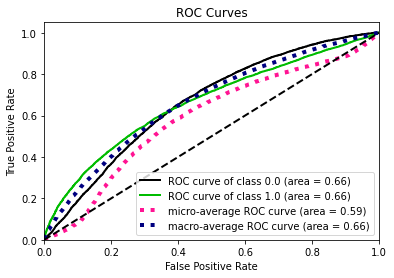

In [283]:
import scikitplot as skplt
from sklearn.metrics import plot_roc_curve

clf=Pipeline([('transformer', QuantileTransformer()), 
              ('selector', SelectKBest(k=11)), 
              ('clf', MLPClassifier(activation='tanh',
                                    alpha=0.05,solver='sgd',
                                    hidden_layer_sizes=(100, 50, 50), 
                                    learning_rate='adaptive',max_iter=500,
                                    random_state=1))])# fitting the model 
clf.fit(X_train, y_train) 
y_true, y_pred = y_test , clf.predict(X_test)
print(classification_report(y_test, y_pred))
cm=confusion_matrix(y_test,y_pred,labels=clf.classes_)
ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot()

y_probas = clf.predict_proba(X_test)
#print (y_probas)
skplt.metrics.plot_roc(y_true, y_probas)
plt.show()


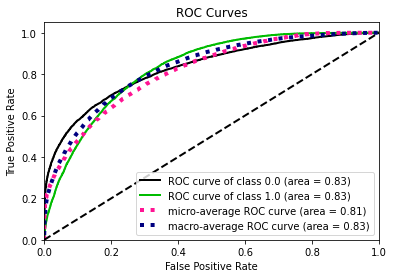

In [96]:
import scikitplot as skplt
from sklearn.metrics import plot_roc_curve

clf=MLPClassifier(solver='adam',learning_rate='adaptive',
                     hidden_layer_sizes=(100,),alpha=0.00086,
                  activation='tanh')
# fitting the model 
clf.fit(X_train, y_train) 
y_true, y_pred = y_test , clf.predict(X_test)
y_probas = clf.predict_proba(X_test)
#print (y_probas)
skplt.metrics.plot_roc(y_true, y_probas)
plt.show()


# Clustering

In [36]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [89]:
from sklearn.cluster import FeatureAgglomeration
#we have 3 features in the Iris dataset. but we suspect that perhaps we can agglomerate them into 2 features.
agglo = FeatureAgglomeration(n_clusters = 8,linkage="average")
agglo.fit(X_train)

X_reduced = agglo.transform(X_train)

k_means = KMeans(n_clusters=2, init = "k-means++")
k_means.fit(X_reduced)

labels_pred = k_means.predict(X_reduced)
# print(labels_pred)

In [90]:
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import adjusted_mutual_info_score

score2 = adjusted_mutual_info_score(y_train, labels_pred)
score_reduced = adjusted_rand_score(y_train, labels_pred)
print("Full features score", score2)
print("Reduced Features score: ", score_reduced)

Full features score 0.08415396982354018
Reduced Features score:  0.06080134653062951


In [44]:
X_train.shape

(37484, 24)

Text(0, 0.5, 'Cumulative Explained Variance')

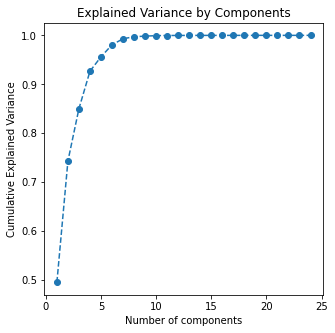

In [46]:
# Fit in to the validation data
pca = PCA()
pca.fit(X_train)

# pca.explained_variance_ratio_

# Plot to find the optimum number of features from PCA
plt.figure(figsize=(5,5))
plt.plot(range(1,25), pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative Explained Variance')

In [47]:
# Chosen 4 principle components for the dataset
pca = PCA(4)
X_train_pca = pca.fit_transform(X_train)

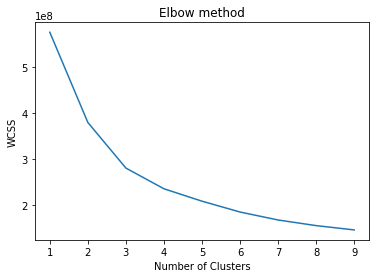

In [48]:
# Using the elbow method to find the optimal number of clusters
from sklearn.cluster import KMeans
wcss = []

kmeans_models = [KMeans(n_clusters=k).fit(X_train_pca) for k in range (1, 10)]
innertia = [model.inertia_ for model in kmeans_models]

plt.plot(range(1, 10), innertia)
plt.title('Elbow method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

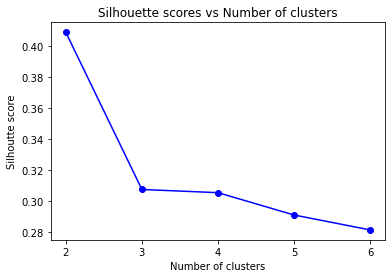

In [49]:
from sklearn.metrics import silhouette_score

silhoutte_scores = [silhouette_score(X_train_pca, model.labels_) for model in kmeans_models[1:6]]
plt.plot(range(2,7), silhoutte_scores, "bo-")
plt.xticks([2, 3, 4, 5, 6])
plt.title('Silhouette scores vs Number of clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte score')
plt.show()

In [91]:
# Fitting K-Means to the dataset
kmeans = KMeans(n_clusters = 2, init = 'k-means++', random_state = 1)

y_kmeans = kmeans.fit_predict(X_train_pca)

In [92]:
# Concatenate 4 PCA components and K_means segmentation variable to the validation dataset
X_train_pca_kmeans = pd.concat([X_train.reset_index(drop=True), pd.DataFrame(X_train_pca)], axis=1)
X_train_pca_kmeans.columns.values[-4:] = ['Component 1','Component 2','Component 3','Component 4']

X_train_pca_kmeans['Segmentation K-means'] = kmeans.labels_

C:\Users\PC\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


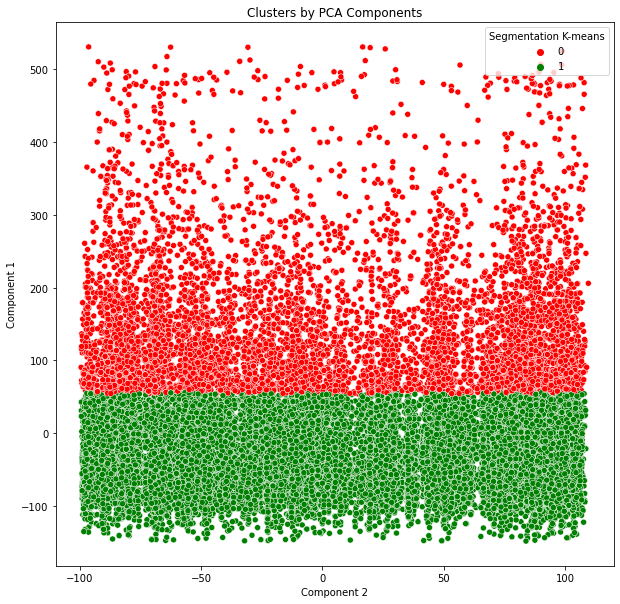

In [93]:
x_axis = X_train_pca_kmeans['Component 2']
y_axis = X_train_pca_kmeans['Component 1']
plt.figure(figsize=(10,10))
sns.scatterplot(x_axis, y_axis, hue = X_train_pca_kmeans['Segmentation K-means'], palette = ['r','g'])
plt.title('Clusters by PCA Components')
plt.show()

C:\Users\PC\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'True labels by PCA Components')

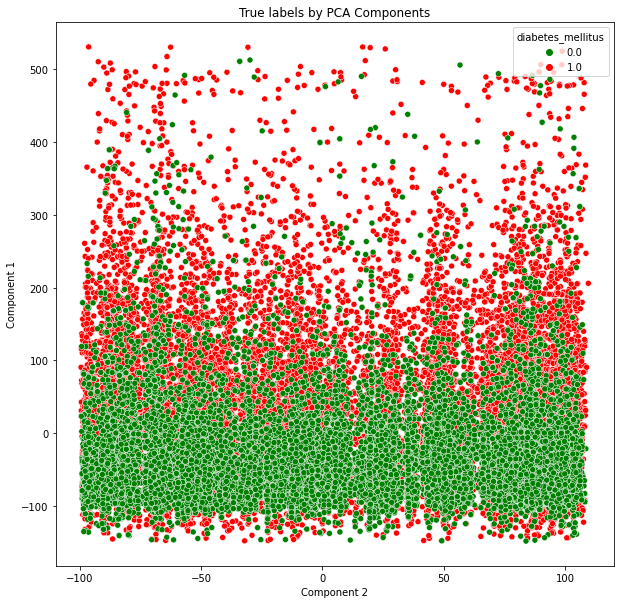

In [94]:
plt.figure(figsize=(10,10))
sns.scatterplot(x_axis, y_axis, hue = y_train, palette = ['g','r'])
plt.title('True labels by PCA Components')

In [95]:
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import adjusted_mutual_info_score

score1 = adjusted_mutual_info_score(y_train, y_kmeans)
print(score1)
score2 = adjusted_rand_score(y_train, y_kmeans)
print(score2)

0.08402140857927971
0.059753404109853


### Pipeline clustering

In [80]:
from sklearn.cluster import KMeans

In [87]:
preprocessor = Pipeline(
[("scaler", MinMaxScaler()),
("pca", PCA(n_components=2, random_state=42))])

In [84]:
clusterer=Pipeline(
[("kmeans", KMeans(n_clusters=2,
                 init="k-means++",
                 n_init=50,
                 max_iter=500,
                 random_state=42))])

In [91]:
pipe=Pipeline([("preprocessor",preprocessor),
              ("clusterer",clusterer)])

In [92]:
pipe.fit(X_train)

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('scaler', MinMaxScaler()),
                                 ('pca',
                                  PCA(n_components=2, random_state=42))])),
                ('clusterer',
                 Pipeline(steps=[('kmeans',
                                  KMeans(max_iter=500, n_clusters=2, n_init=50,
                                         random_state=42))]))])

In [93]:
preprocessed_data=pipe["preprocessor"].transform(X_train)
predicted_labels=pipe["clusterer"]["kmeans"].labels_
silhouette_score(preprocessed_data, predicted_labels)

0.6446627157112419

In [95]:
adjusted_rand_score(y_train, predicted_labels)

0.008142541549205977

In [118]:
pcadf = pd.DataFrame(
    pipe["preprocessor"].transform(X_train),
    columns=["component_1", "component_2"],
)

pcadf["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
pcadf["true_label"] = y_train.values

C:\Users\PC\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


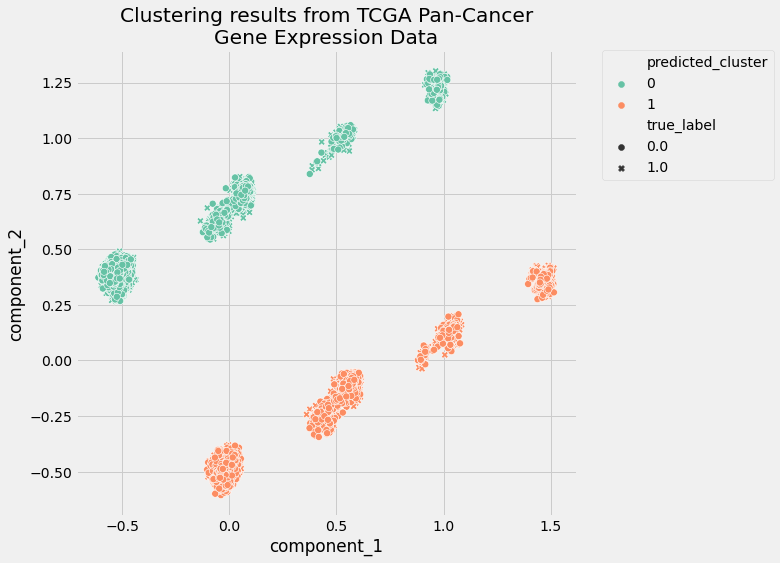

In [119]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(8, 8))

scat = sns.scatterplot(
    "component_1",
    "component_2",
    s=50,
    data=pcadf,
    hue="predicted_cluster",
    style="true_label",
    palette="Set2",
)

scat.set_title(
    "Clustering results from TCGA Pan-Cancer\nGene Expression Data"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [121]:
true_labels=y_train.values

In [122]:
# Empty lists to hold evaluation metrics
silhouette_scores = []
ari_scores = []
for n in range(2, 11):
    # This set the number of components for pca,
    # but leaves other steps unchanged
    pipe["preprocessor"]["pca"].n_components = n
    pipe.fit(X_train)

    silhouette_coef = silhouette_score(
        pipe["preprocessor"].transform(X_train),
        pipe["clusterer"]["kmeans"].labels_,
    )
    ari = adjusted_rand_score(
        true_labels,
        pipe["clusterer"]["kmeans"].labels_,
    )

    # Add metrics to their lists
    silhouette_scores.append(silhouette_coef)
    ari_scores.append(ari)

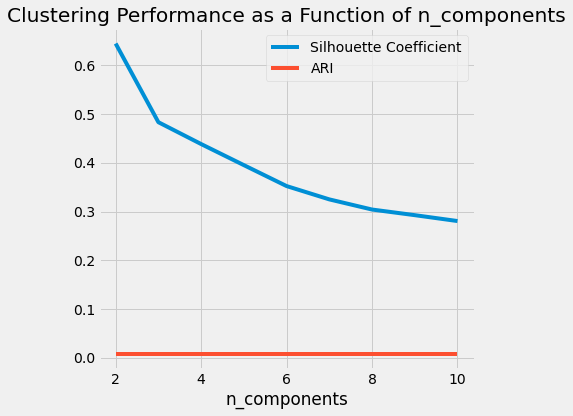

In [123]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(6, 6))
plt.plot(
    range(2, 11),
    silhouette_scores,
    c="#008fd5",
    label="Silhouette Coefficient",
)
plt.plot(range(2, 11), ari_scores, c="#fc4f30", label="ARI")

plt.xlabel("n_components")
plt.legend()
plt.title("Clustering Performance as a Function of n_components")
plt.tight_layout()
plt.show()